<a href="https://colab.research.google.com/github/pachterlab/CP_2023/blob/main/notebooks/combinedFigurePlots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!date

Mon Dec 12 19:03:14 UTC 2022


In [1]:
!git clone https://github.com/pachterlab/CP_2023.git

Cloning into 'CP_2023'...
remote: Enumerating objects: 905, done.
remote: Counting objects: 100% (905/905), done.
remote: Compressing objects: 100% (403/403), done.
remote: Total 905 (delta 495), reused 836 (delta 472), pack-reused 0
Receiving objects: 100% (905/905), 340.29 MiB | 14.58 MiB/s, done.
Resolving deltas: 100% (495/495), done.
Updating files: 100% (98/98), done.


In [2]:

!pip3 install --quiet torch
!pip3 install --quiet anndata
!pip3 install --quiet matplotlib
!pip3 install --quiet scikit-learn
!pip3 install --quiet torchsummary
!pip install --quiet scanpy
# !pip3 install --quiet scvi-tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 54.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.5/63.5 kB 7.5 MB/s eta 0:00:00


In [3]:
%cd /content/CP_2023/data
!gunzip *.gz

/content/CP_2023/data


In [4]:
%cd /content/CP_2023/scripts

/content/CP_2023/scripts


## **Install Packages**

In [21]:
import anndata 
import pandas as pd
import numpy as np

import visualizations as vis

import random
# import scvi
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.neighbors import NeighborhoodComponentsAnalysis, NearestNeighbors
from sklearn.metrics import pairwise_distances
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import scale
import torch
import time
import scanpy as sc
import seaborn as sns
import umap
from scipy import stats
import scipy.io as sio
import matplotlib
matplotlib.rc('axes',edgecolor='black')
%matplotlib inline
sc.set_figure_params(dpi=125)
sns.set_style('white')

## **Import Data**

In [6]:
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams['axes.linewidth'] = 0.1

state = 42
ndims = 2

data_path = '../data'

pcs = 50
n_latent = 50

### **Correlation Metric Plots for Picasso Figures**

Using L2 for inter-/intra- metrics

In [ ]:
uteroCorrs = pd.read_csv(data_path+'/exUtElMapVals_22.csv')
smartCorrs = pd.read_csv(data_path+'/smartElVals_22.csv')
merCorrs = pd.read_csv(data_path+'/merfishElVals_22.csv') 
smartCorrs.head()

,Unnamed: 0,Latent,Distance,Pearsonr,Dimension
0,0,Map,Inter-Type,0.483653,MCML 2D
1,1,Map,Intra-Sex,0.251161,MCML 2D
2,2,Map,Intra-Type,0.265971,MCML 2D
3,3,Map,Inter-Sex,0.176906,MCML 2D
4,4,Map,Inter-Type,0.349418,MCML 2D


In [ ]:
np.unique(uteroCorrs['Latent'])

array(['Elephant', 'Flower', 'Map', 'PCA 2D', 'PCA 50D', 'PCA TSNE',
       'PCA UMAP', 'PCA densMAP', 'PCA densSNE'], dtype=object)

In [ ]:
for obj in [uteroCorrs,smartCorrs,merCorrs]:

  obj['Latent'] = [x.replace('PCA UMAP', 'PCA 50D UMAP') for x in obj['Latent']]
  obj['Latent'] = [x.replace('PCA TSNE', 'PCA 50D t-SNE') for x in obj['Latent']]
  obj['Latent'] = [x.replace('PCA densMAP', 'PCA 50D densMAP') for x in obj['Latent']]
  obj['Latent'] = [x.replace('PCA densSNE', 'PCA 50D dens-SNE') for x in obj['Latent']]

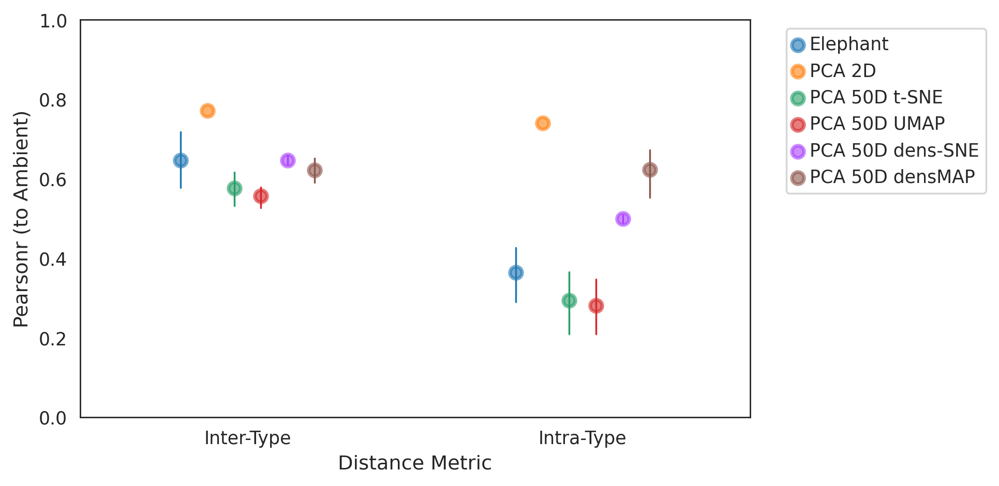

In [ ]:
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)

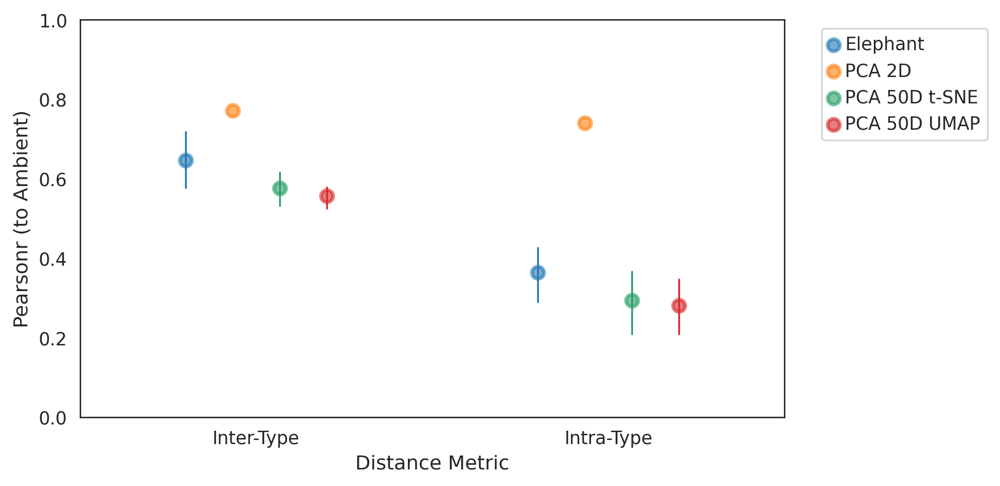

In [ ]:
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)

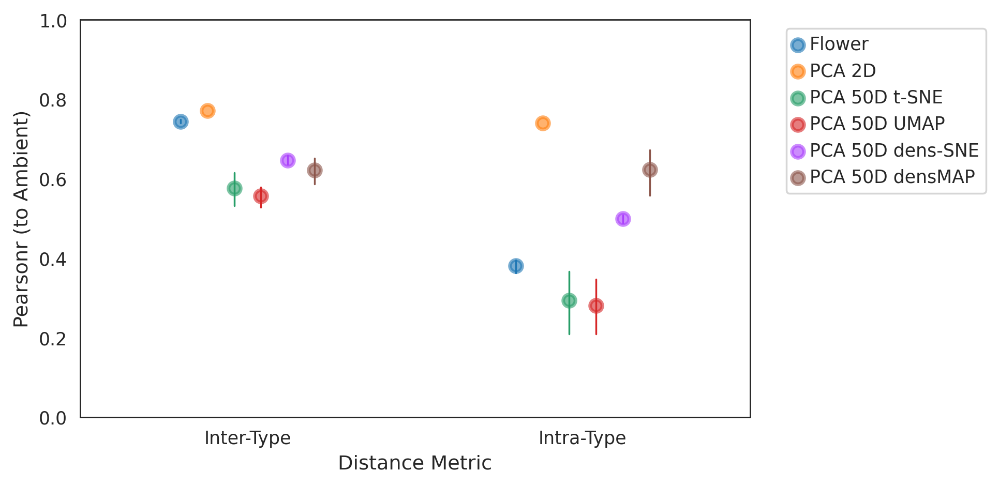

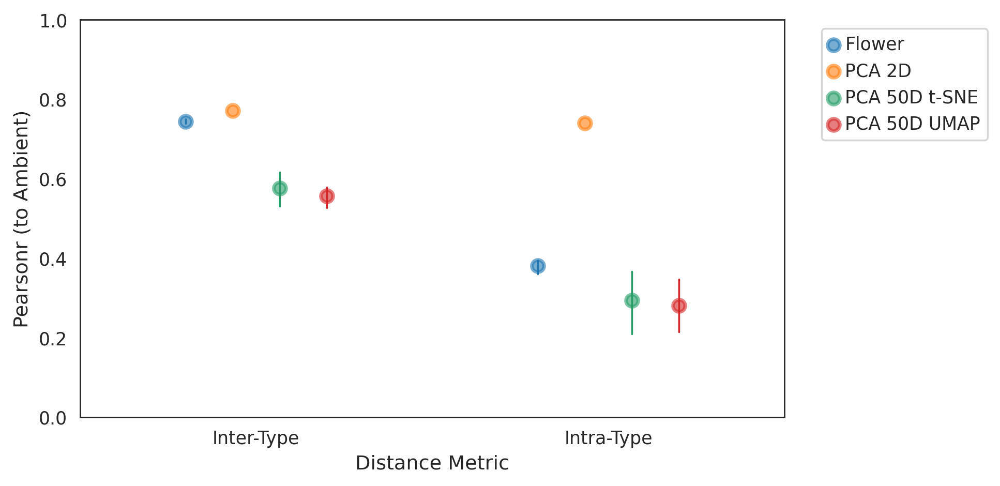

In [ ]:
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)

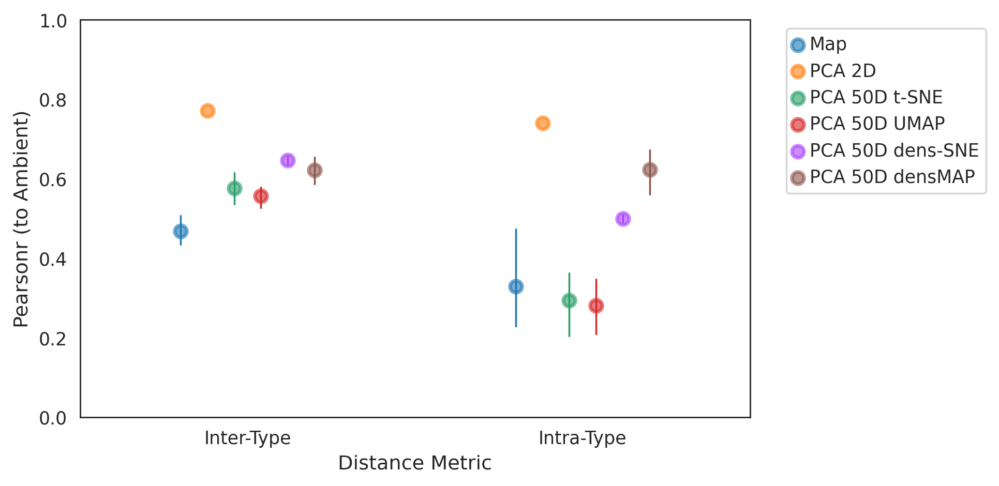

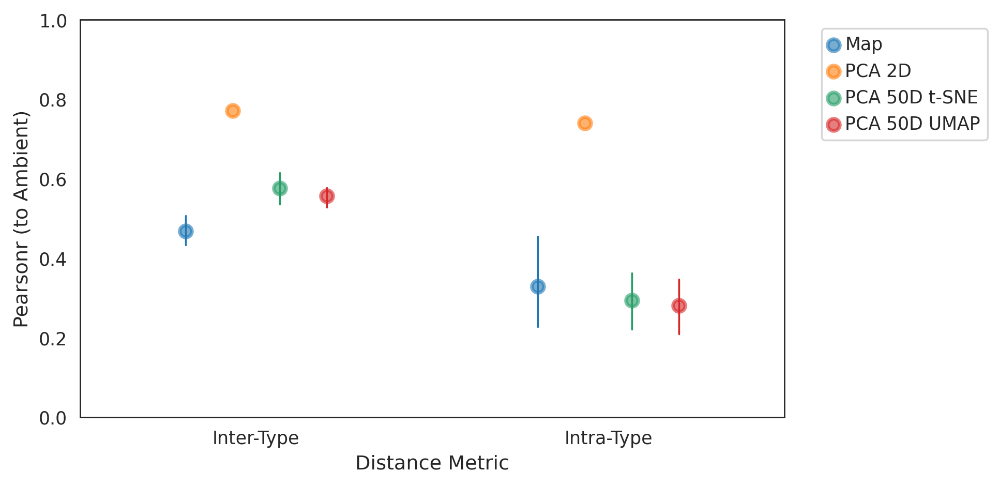

In [ ]:
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)

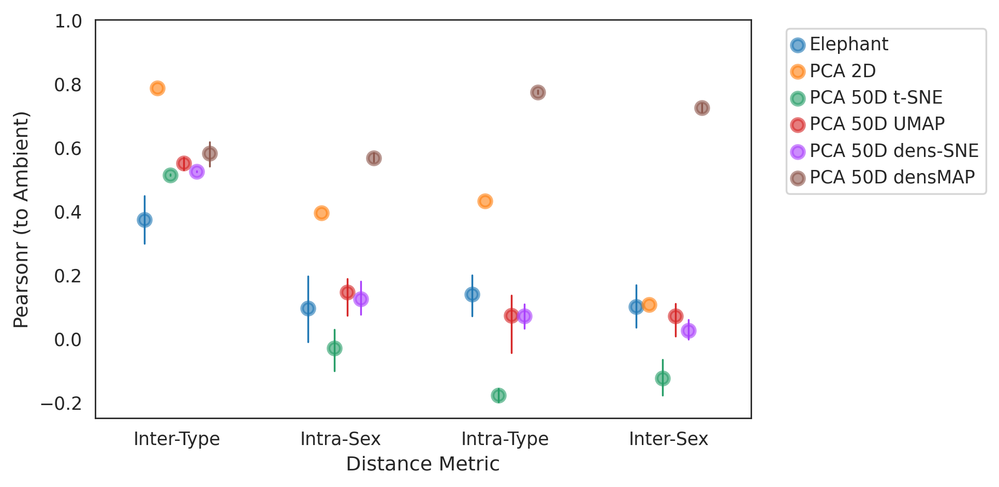

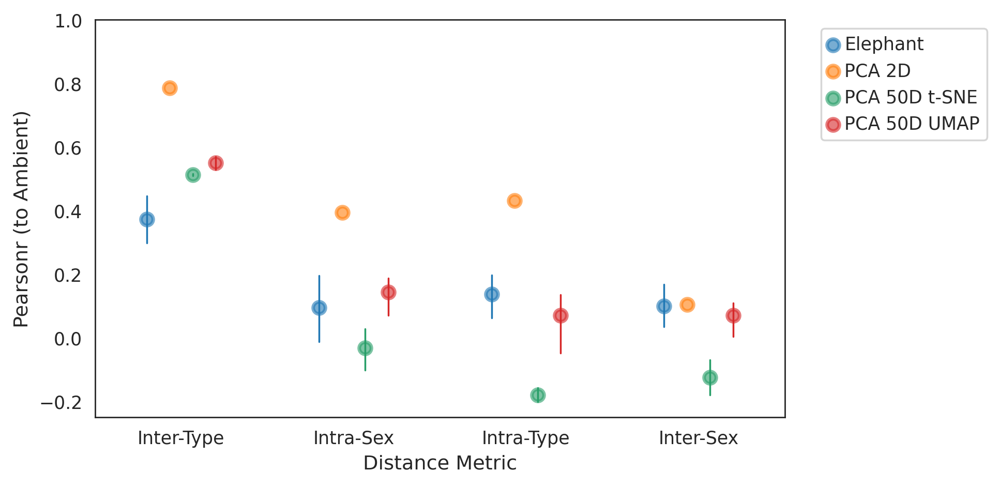

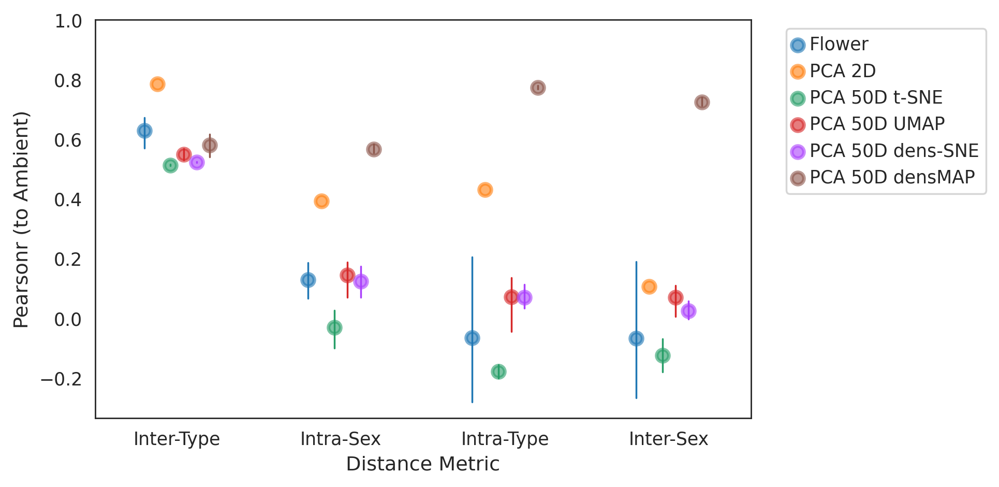

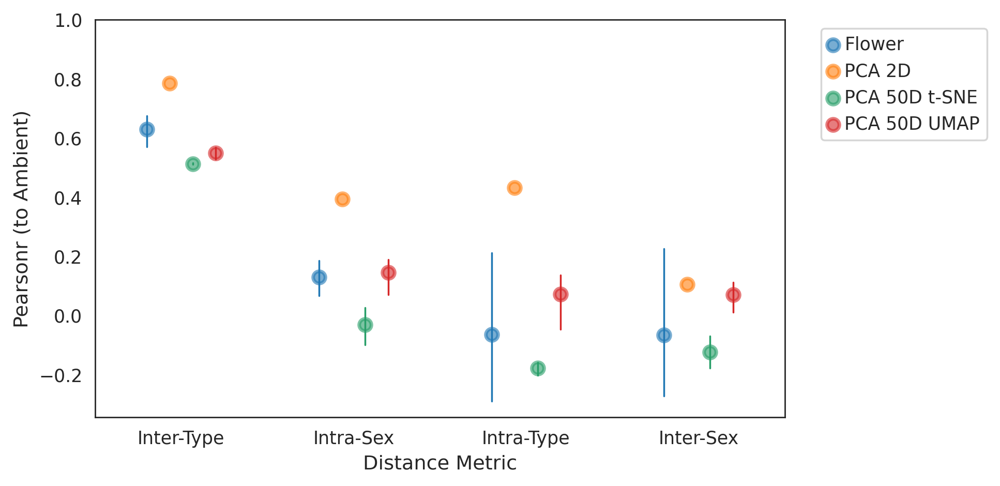

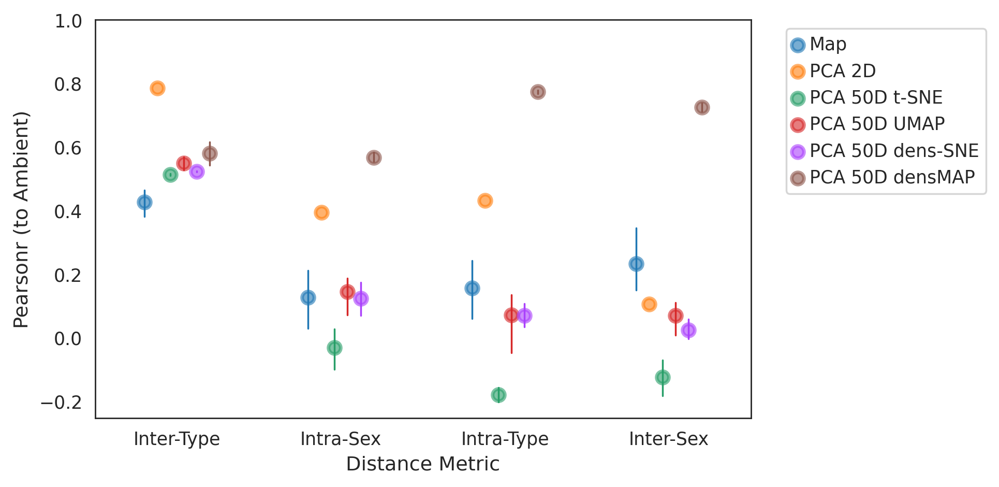

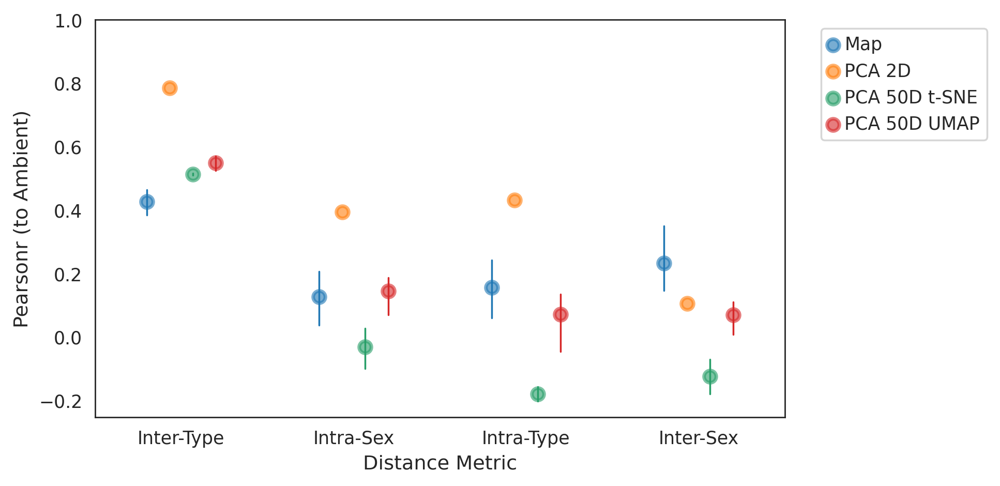

In [ ]:
#smartseq
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

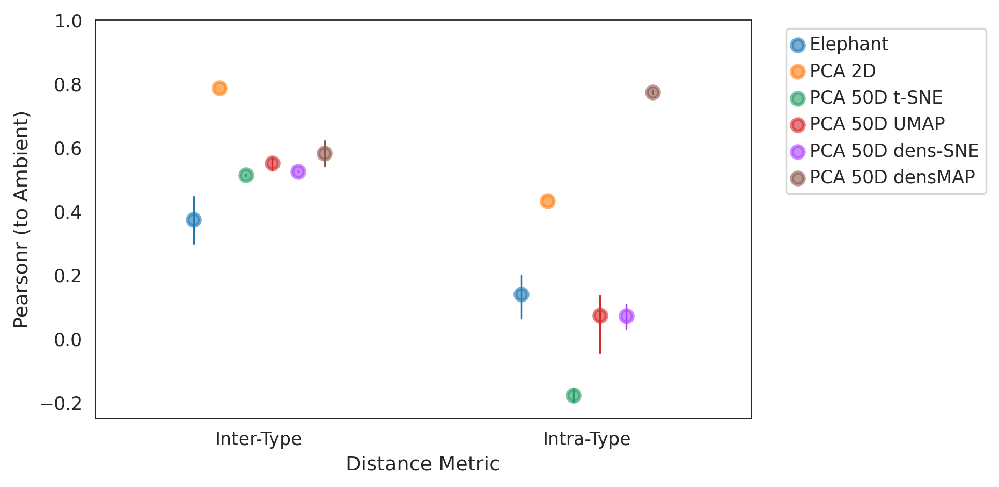

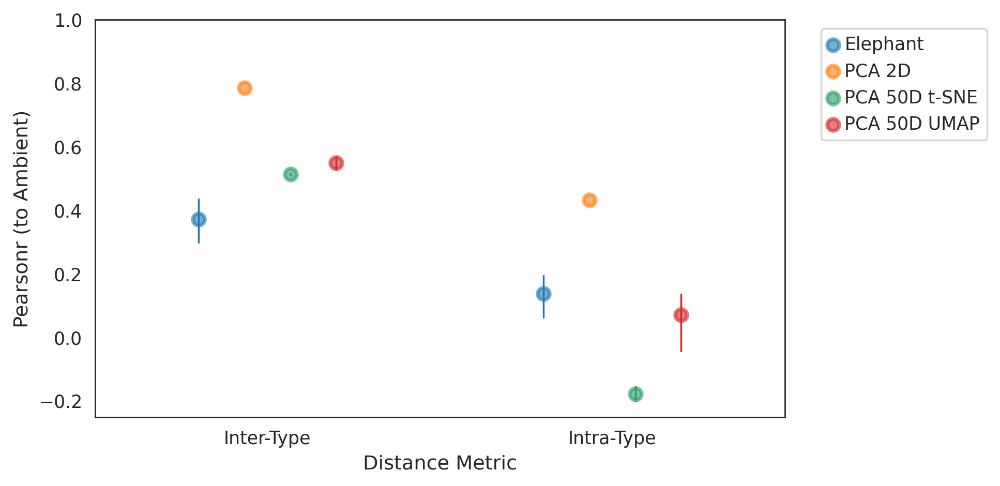

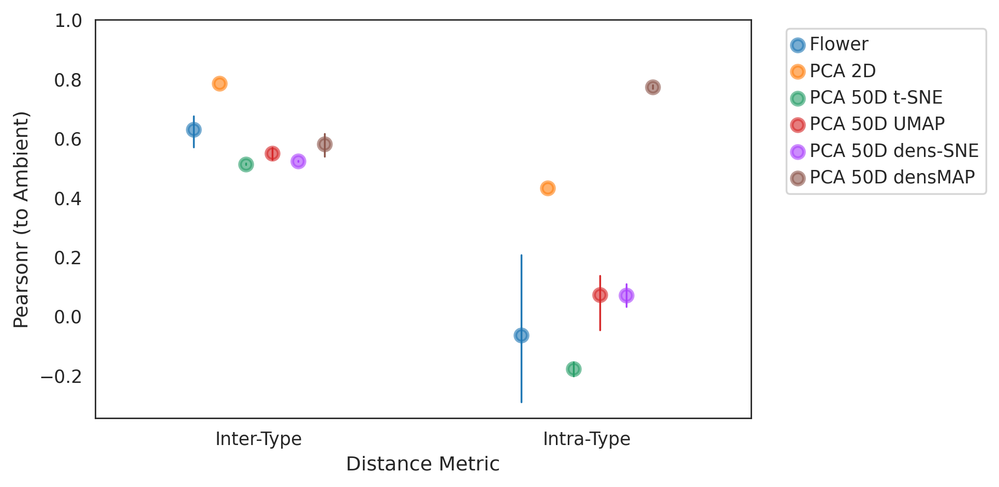

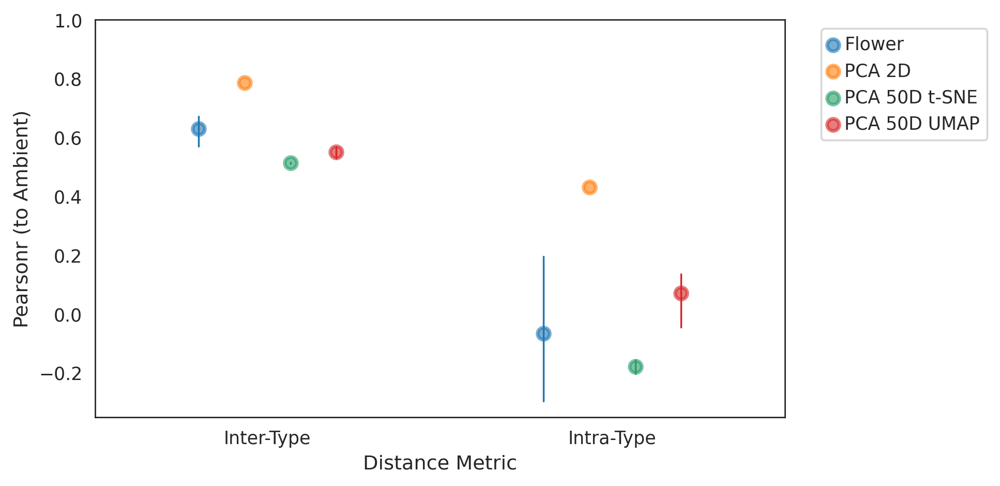

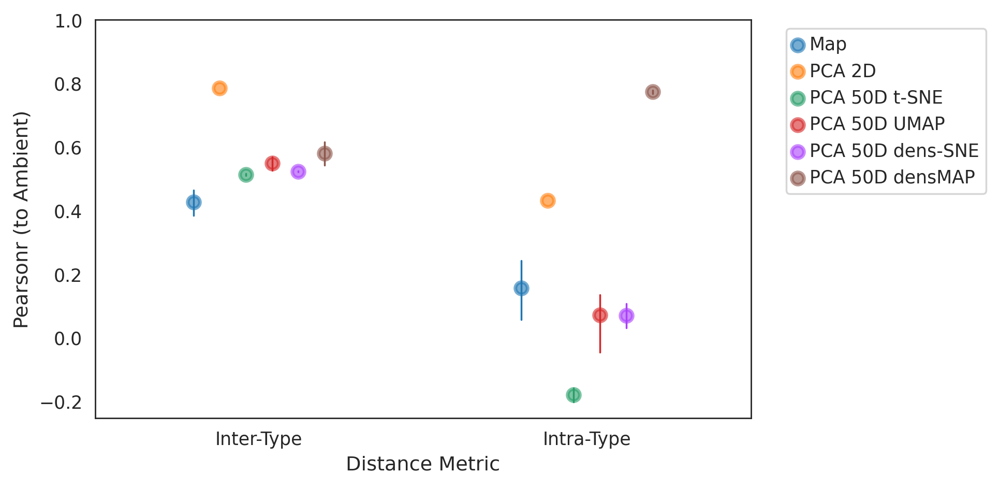

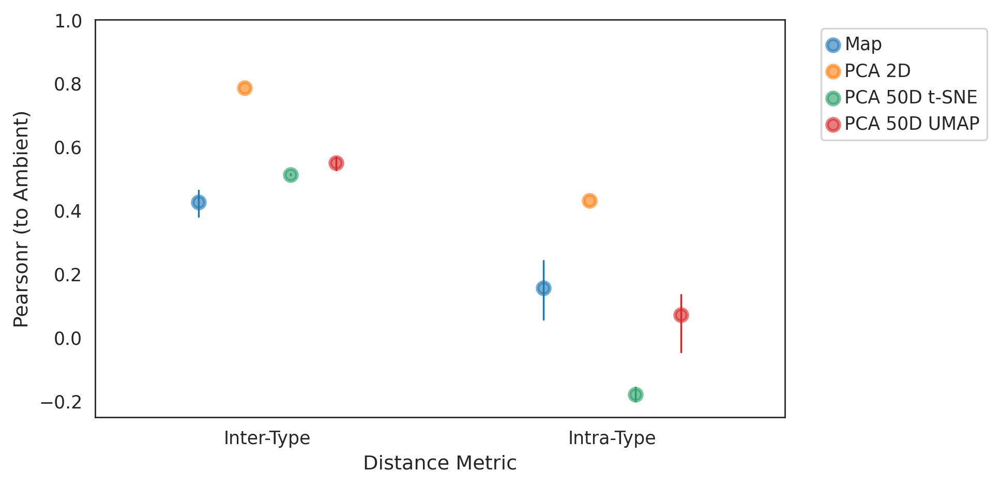

In [ ]:
#smartseq
smartCorrs = smartCorrs[~smartCorrs['Distance'].isin(['Intra-Sex','Inter-Sex'])]
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

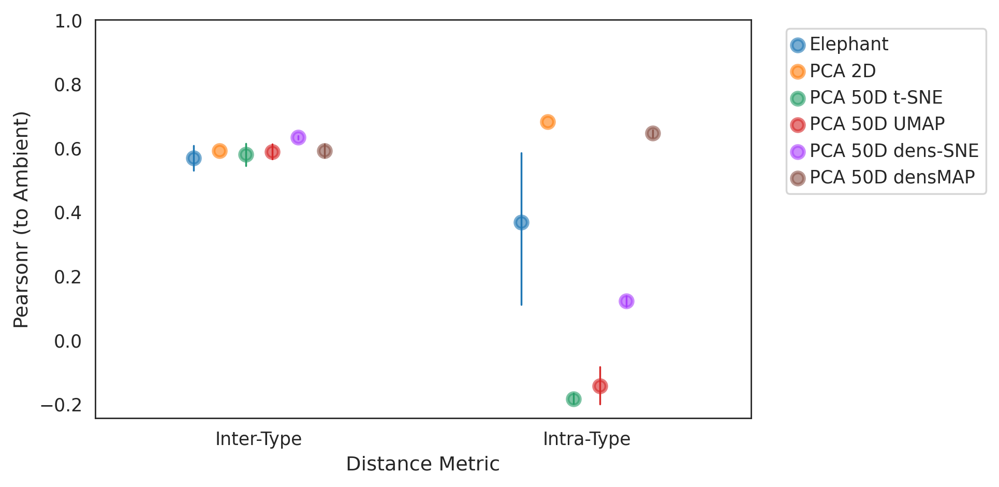

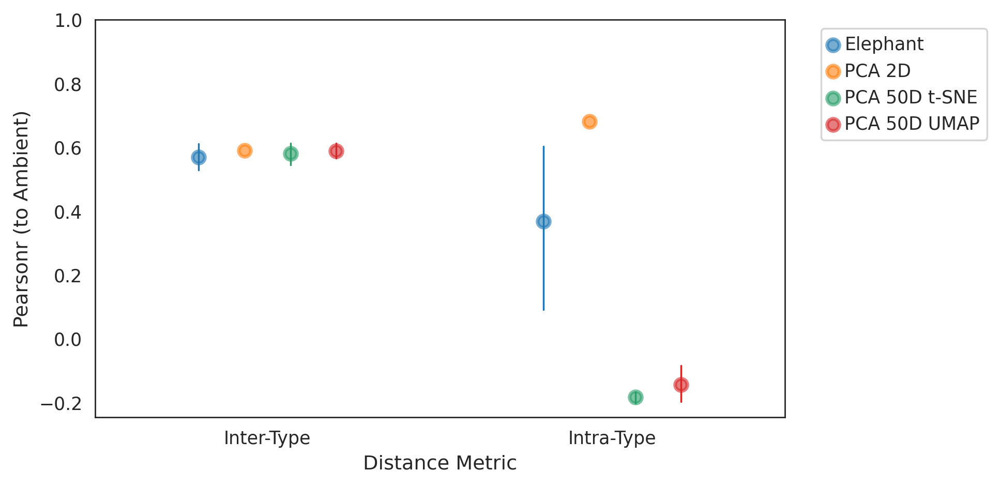

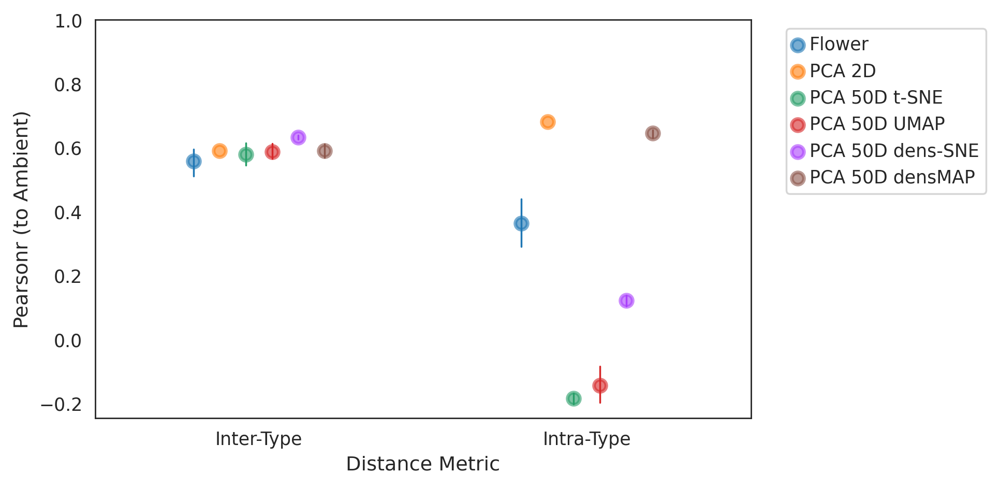

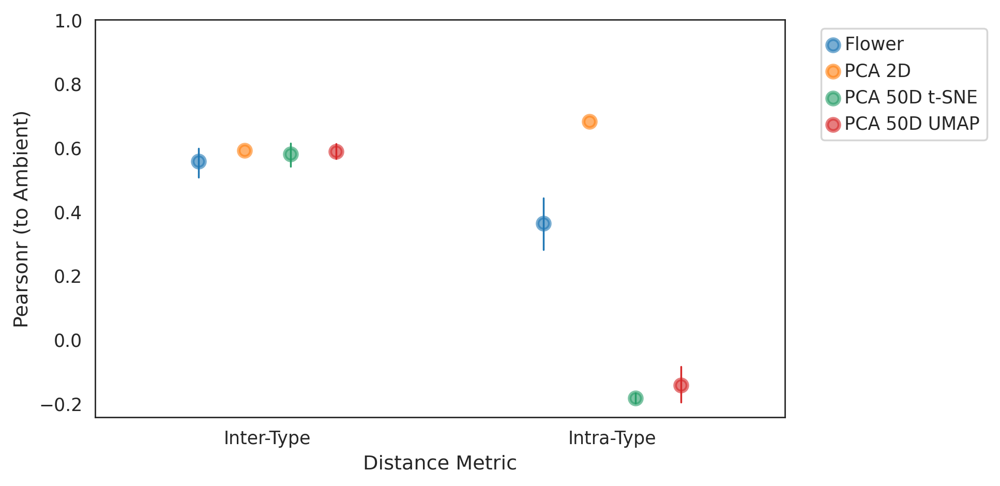

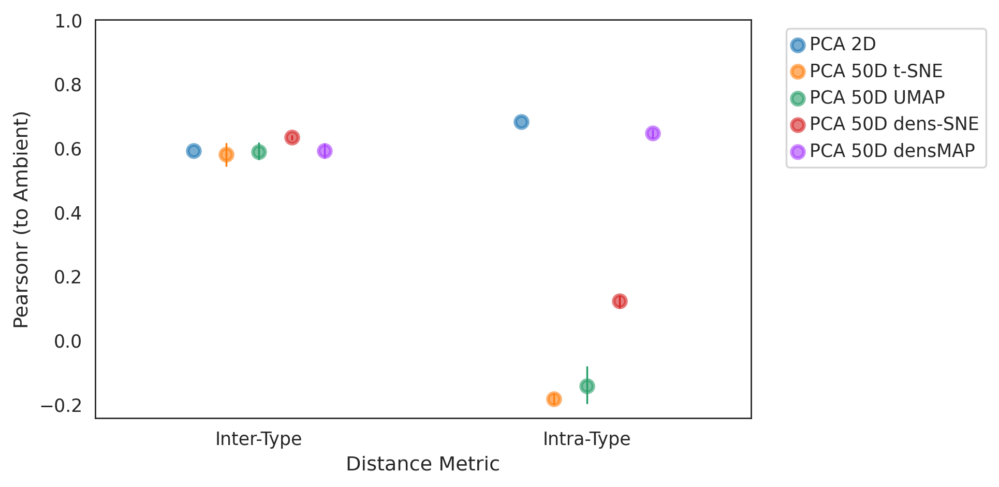

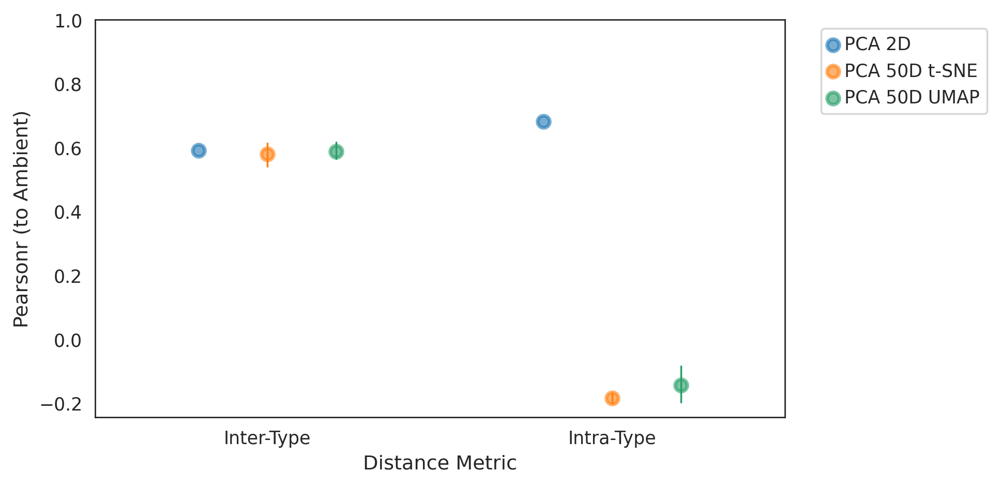

In [ ]:
#merfish

vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

L1 metrics

In [ ]:
uteroCorrs = pd.read_csv(data_path+'/exUtElMapVals.csv')
smartCorrs = pd.read_csv(data_path+'/smartSeqElVals.csv')
merCorrs = pd.read_csv(data_path+'/merfishElVals.csv') 
smartCorrs.head()

,Unnamed: 0,Latent,Distance,Pearsonr,Dimension
0,0,Elephant,Inter-Type,0.407403,MCML 2D
1,1,Elephant,Intra-Sex,-0.113936,MCML 2D
2,2,Elephant,Intra-Type,-0.192708,MCML 2D
3,3,Elephant,Inter-Sex,-0.008465,MCML 2D
4,4,Elephant,Inter-Type,0.361200,MCML 2D


In [ ]:
for obj in [uteroCorrs,smartCorrs,merCorrs]:

  obj['Latent'] = [x.replace('PCA UMAP', 'PCA 50D UMAP') for x in obj['Latent']]
  obj['Latent'] = [x.replace('PCA TSNE', 'PCA 50D t-SNE') for x in obj['Latent']]
  obj['Latent'] = [x.replace('PCA densMAP', 'PCA 50D densMAP') for x in obj['Latent']]
  obj['Latent'] = [x.replace('PCA densSNE', 'PCA 50D dens-SNE') for x in obj['Latent']]

In [ ]:
axisFontSize = 11
tickFontSize = 10
errwidth=1
figsize =(8,4)
dodge=0.4

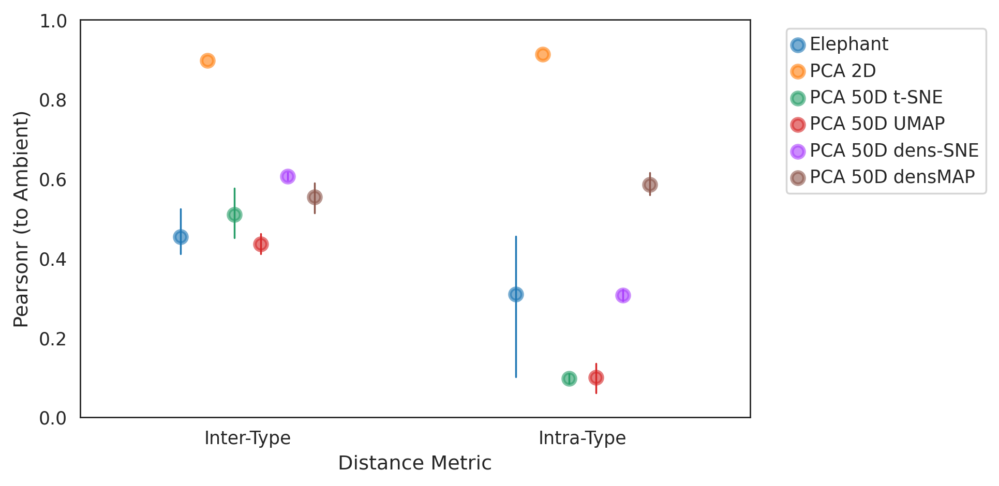

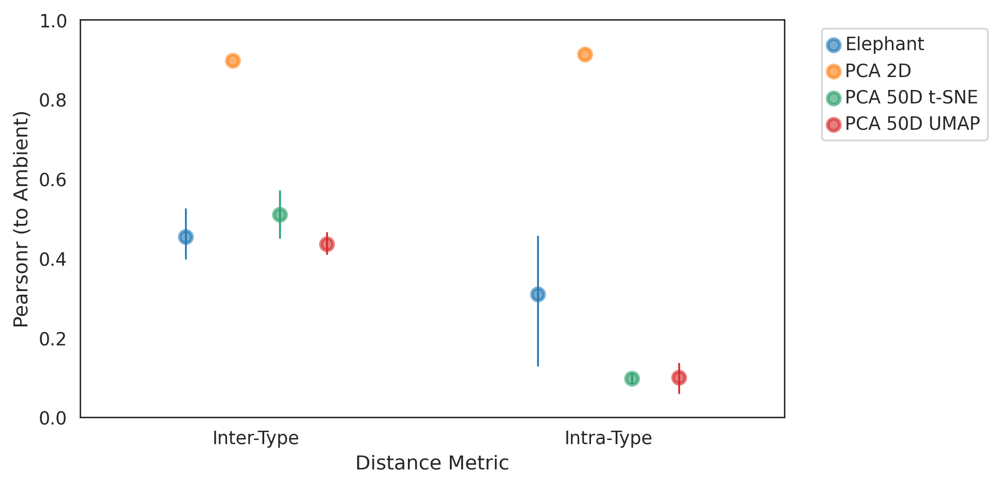

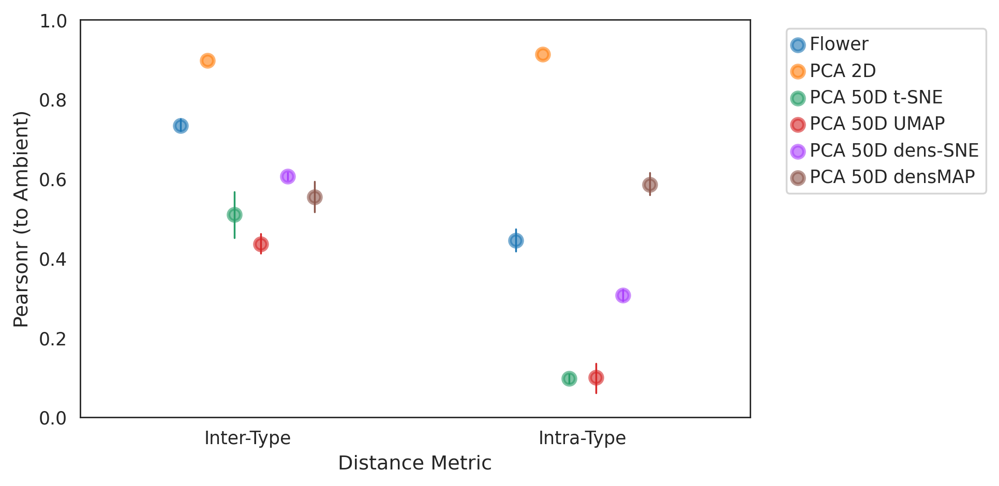

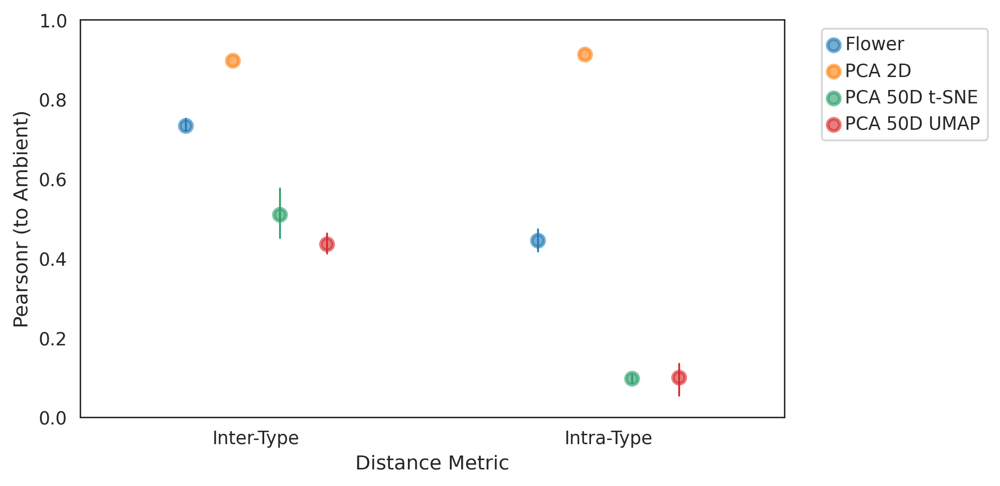

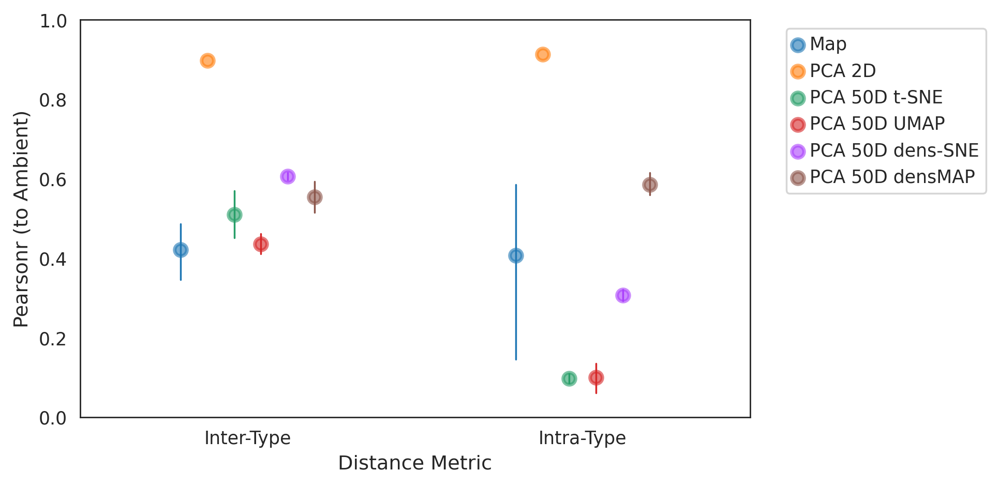

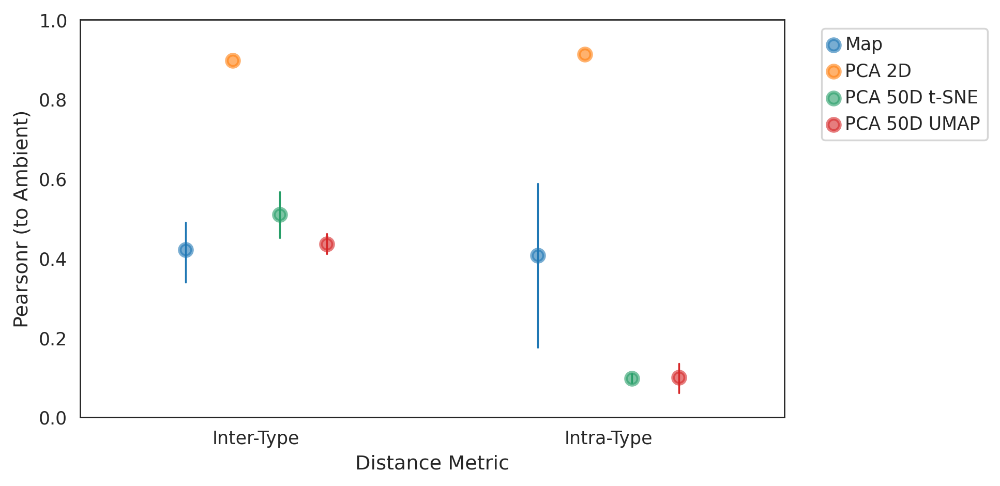

In [ ]:
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)
vis.plotLatentStats(uteroCorrs[~uteroCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymin=0,ymax=1)

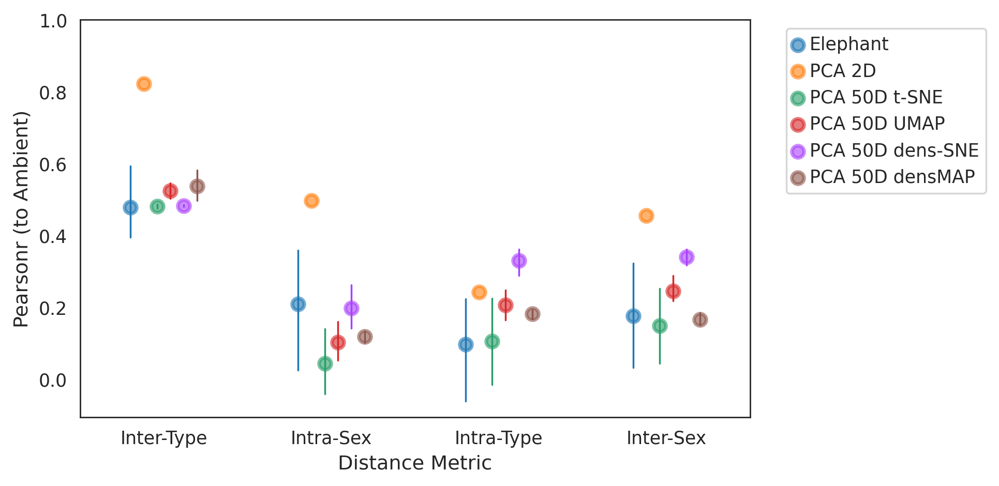

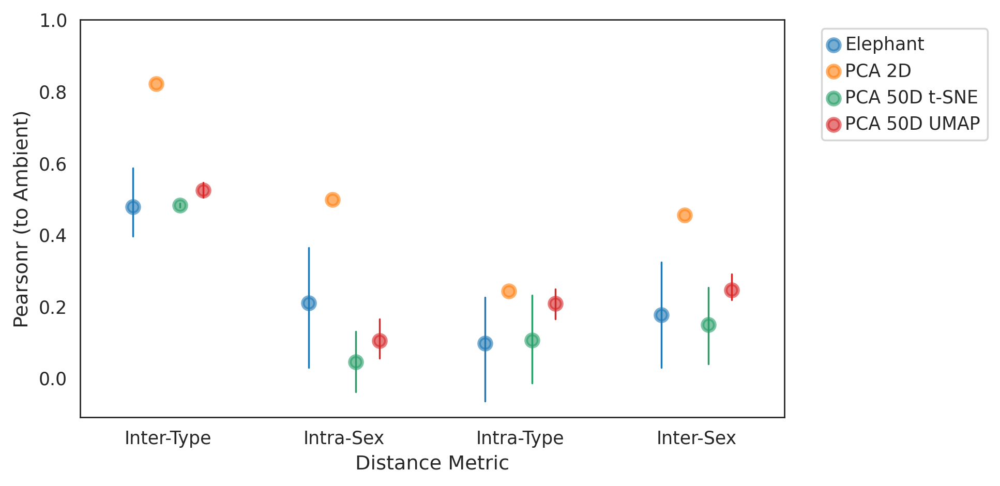

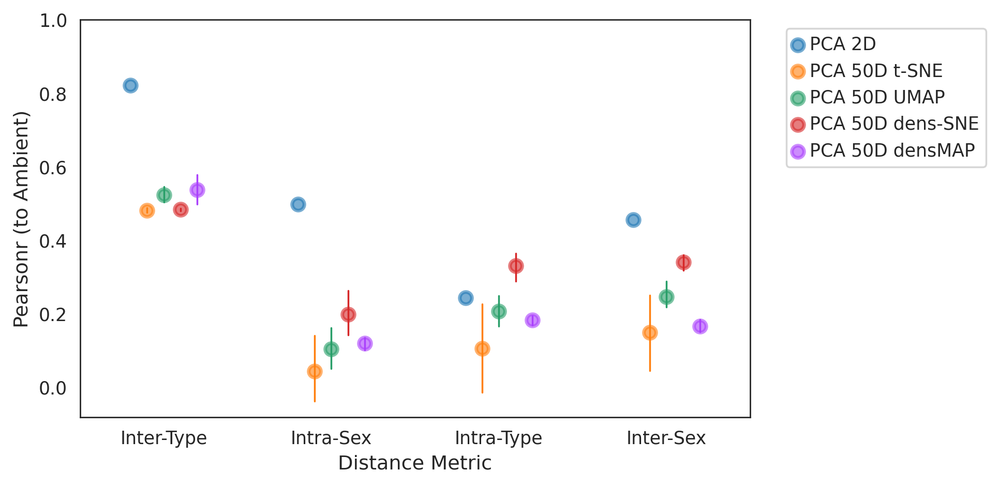

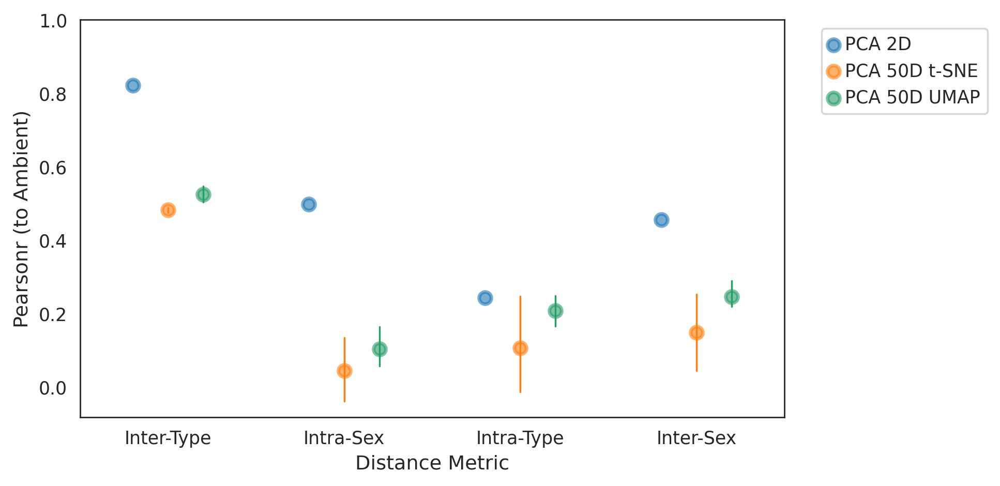

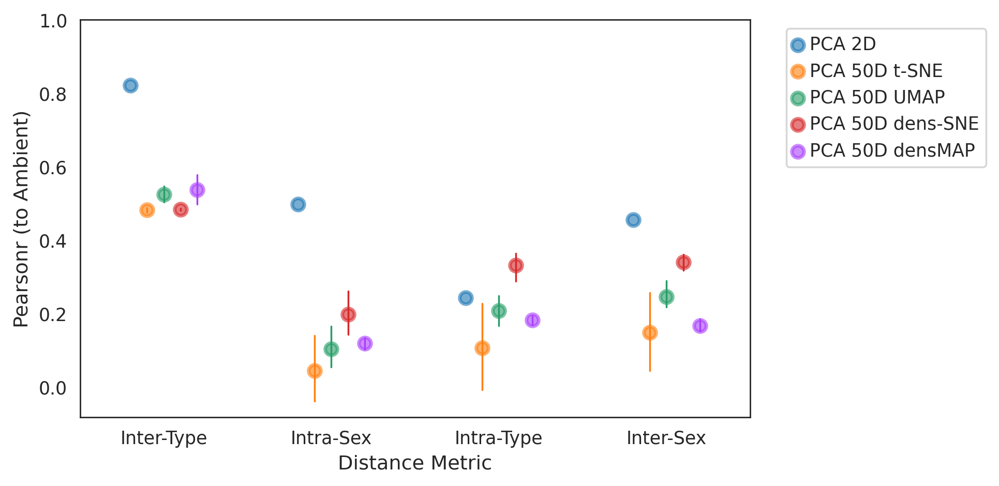

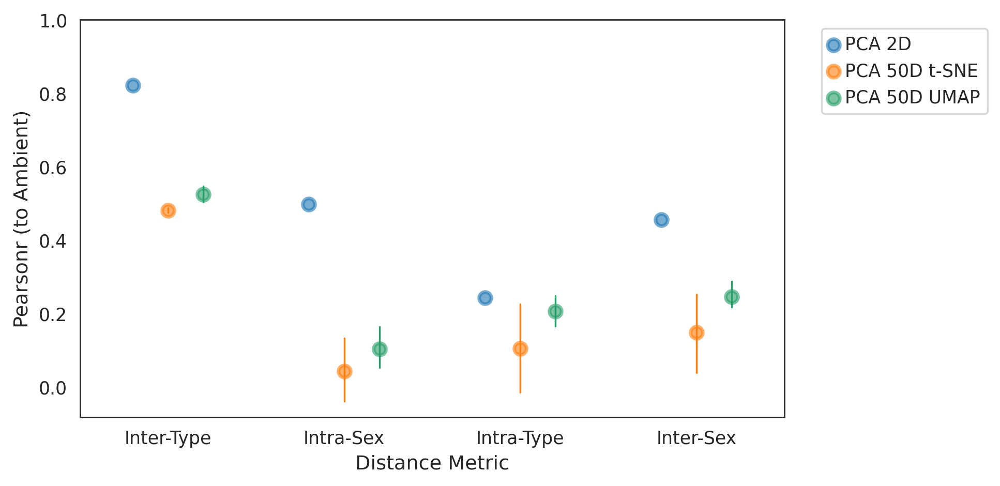

In [ ]:
#smartseq
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(smartCorrs[~smartCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

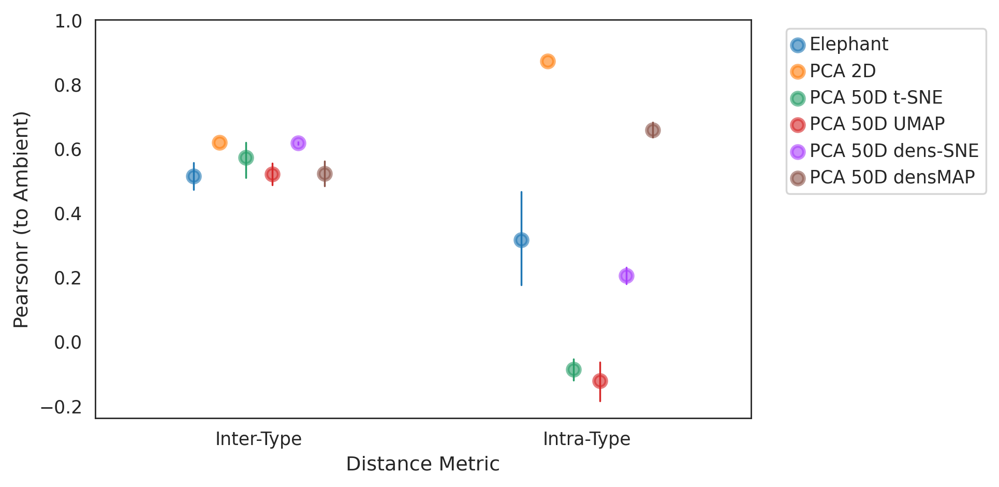

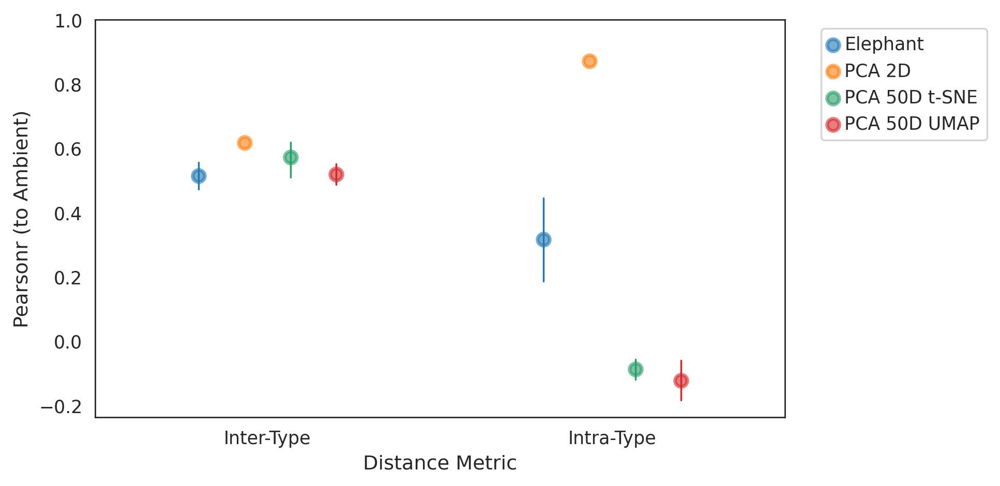

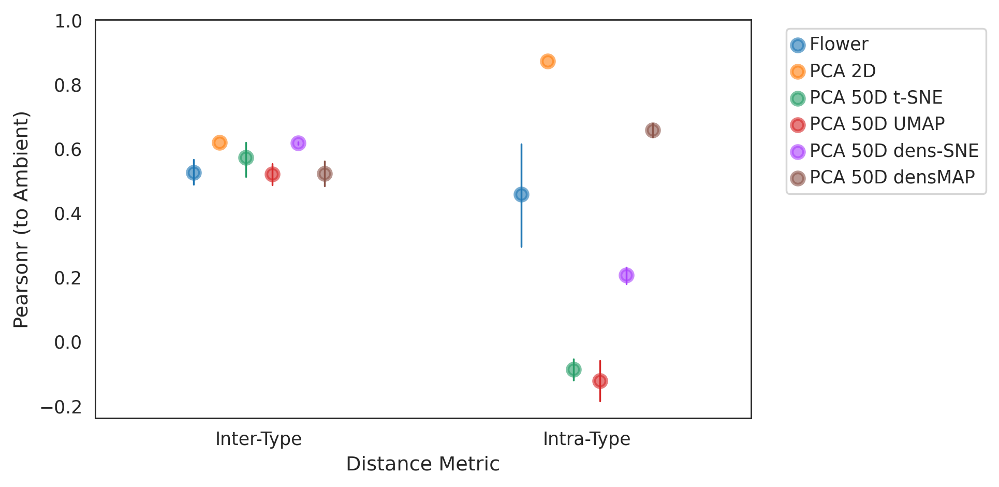

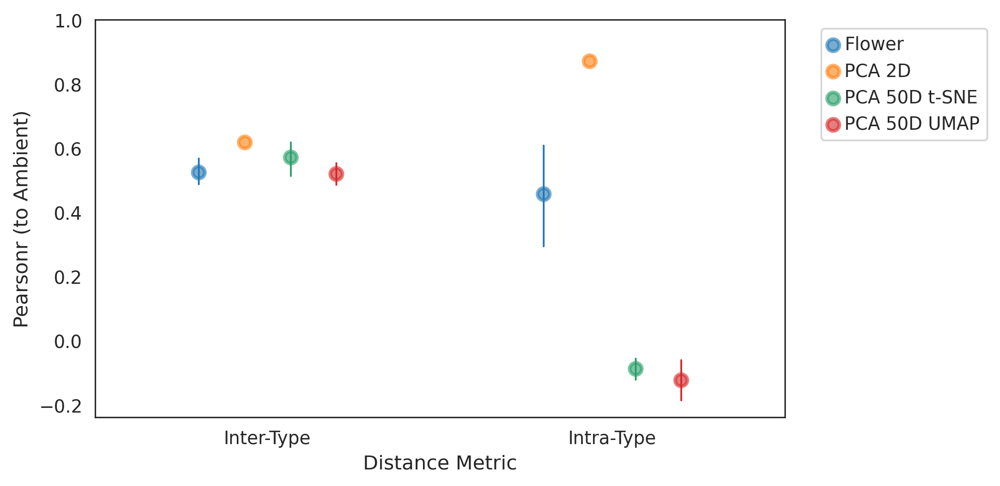

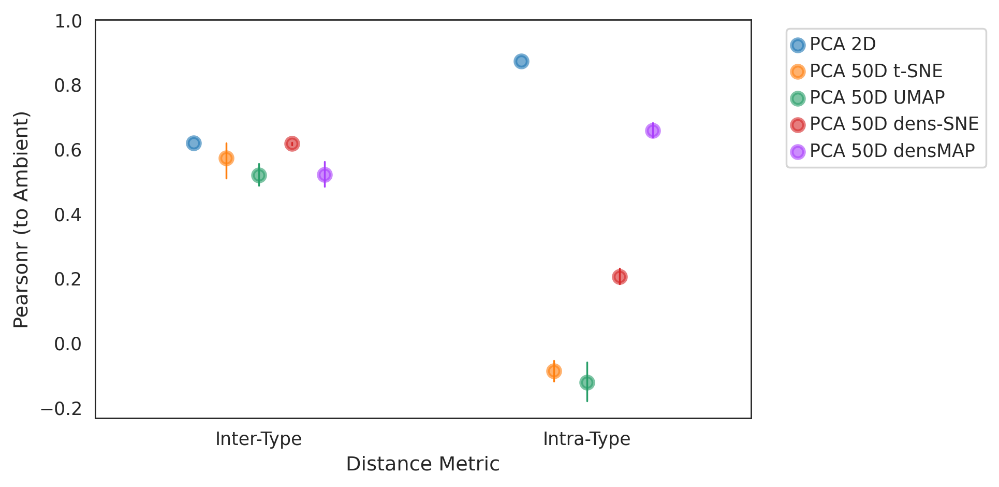

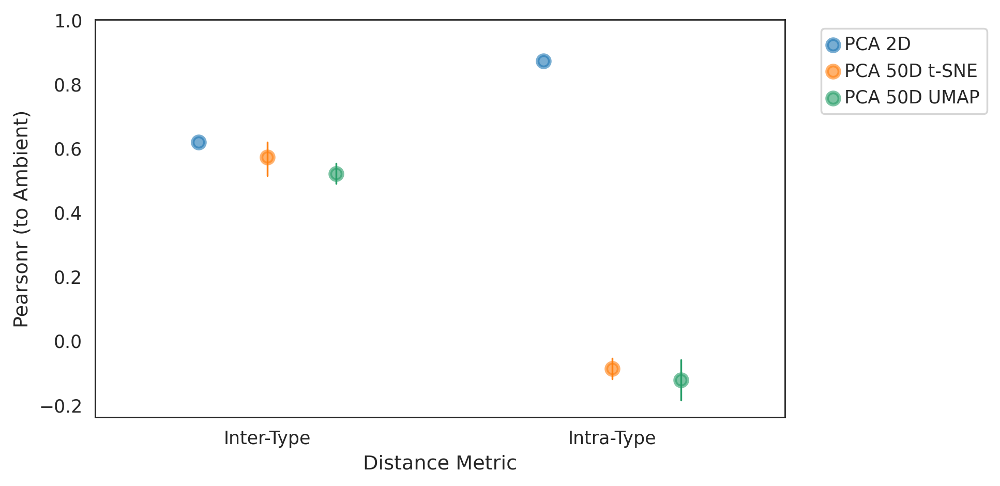

In [ ]:
#merfish

vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Flower','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Flower','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Map','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Map','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Flower','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)
vis.plotLatentStats(merCorrs[~merCorrs['Latent'].isin(['Elephant','Flower','PCA 50D dens-SNE','PCA 50D densMAP','PCA 50D'])], axisFontSize = 11, tickFontSize = 10,ymax=1)

### **Distortion Plots in High and Low Dimensions**
Coupled and non-coupled PCA/t-SNE/UMAP

#### **Equidistant Distortion Metrics**

In [ ]:
def printInfo(res):
  all = np.unique(res.Embed)
  sub = res[res['Embed'].isin(['Integrated-Scaled Ambient'])]
  ambVars = [sub['Vars'],sub['Ratio'],sub['RatioKNN']]
  for i in all:
    #Max var / ambient var
    calc = res[res['Embed'].isin([i])]
    max = np.max(calc['Vars'])/ambVars[0]
    print(i+' var max: '+str(max))
    #Min var / ambient var
    min = np.min(calc['Vars'])/ambVars[0]
    print(i+' var min: '+str(min))


    #Max ratio / ambient ratio
    calc = res[res['Embed'].isin([i])]
    max = np.max(calc['Ratio'])/ambVars[1]
    print(i+' ratio max: '+str(max))
    #Min ratio / ambient ratio
    min = np.min(calc['Ratio'])/ambVars[1]
    print(i+' ratio min: '+str(min))


    #Max ratio / ambient ratio
    calc = res[res['Embed'].isin([i])]
    max = np.max(calc['RatioKNN'])/ambVars[2]
    print(i+' ratio knn max: '+str(max))
    #Min ratio / ambient ratio
    min = np.min(calc['RatioKNN'])/ambVars[2]
    print(i+' ratio knn min: '+str(min))
      

In [ ]:
tenxEq = pd.read_csv(data_path+'/distort10x.csv')
tenxEq.head()

,Unnamed: 0,Vars,Embed,LogVars,Ratio,RatioKNN
0,0,0.520093,PCA 15D,-0.653747,3.052037,2.347171
1,1,6.896855,PCA 15D t-SNE,1.931066,168.707474,58.069157
2,2,1.194494,PCA 15D UMAP,0.177722,64.328323,24.159710
3,3,0.490751,PCA 50D,-0.711819,2.210660,1.758959
4,4,7.283585,PCA 50D t-SNE,1.985623,267.815613,50.184299


In [ ]:
printInfo(tenxEq)

Integrated-Scaled Ambient var max: 36    1.0
Name: Vars, dtype: float64
Integrated-Scaled Ambient var min: 36    1.0
Name: Vars, dtype: float64
Integrated-Scaled Ambient ratio max: 36    1.0
Name: Ratio, dtype: float64
Integrated-Scaled Ambient ratio min: 36    1.0
Name: Ratio, dtype: float64
Integrated-Scaled Ambient ratio knn max: 36    1.0
Name: RatioKNN, dtype: float64
Integrated-Scaled Ambient ratio knn min: 36    1.0
Name: RatioKNN, dtype: float64
PCA 100D var max: 36    53.010008
Name: Vars, dtype: float64
PCA 100D var min: 36    47.373412
Name: Vars, dtype: float64
PCA 100D ratio max: 36    2.106364
Name: Ratio, dtype: float64
PCA 100D ratio min: 36    2.062468
Name: Ratio, dtype: float64
PCA 100D ratio knn max: 36    1.432634
Name: RatioKNN, dtype: float64
PCA 100D ratio knn min: 36    1.395028
Name: RatioKNN, dtype: float64
PCA 100D UMAP var max: 36    95.808806
Name: Vars, dtype: float64
PCA 100D UMAP var min: 36    36.290619
Name: Vars, dtype: float64
PCA 100D UMAP ratio ma

In [ ]:
tenxEq['Embed'] = [i.replace('Integrated-Scaled Ambient','Ambient') for i in tenxEq['Embed']]

Utero E10.5 data

In [ ]:
uteroEq = pd.read_csv(data_path+'/distortUtE105.csv')
uteroEq.head()

,Unnamed: 0,Vars,Embed,LogVars,Ratio,RatioKNN
0,0,0.925687,PCA 15D,-0.077220,4.548433,2.829278
1,1,10.702757,PCA 15D t-SNE,2.370501,34.443367,24.944498
2,2,0.564349,PCA 15D UMAP,-0.572082,23.493973,20.979410
3,3,0.644038,PCA 50D,-0.439997,2.512758,2.560746
4,4,2.847382,PCA 50D t-SNE,1.046400,17.828094,23.102537


In [ ]:
printInfo(uteroEq)

Integrated-Scaled Ambient var max: 36    1.0
Name: Vars, dtype: float64
Integrated-Scaled Ambient var min: 36    1.0
Name: Vars, dtype: float64
Integrated-Scaled Ambient ratio max: 36    1.0
Name: Ratio, dtype: float64
Integrated-Scaled Ambient ratio min: 36    1.0
Name: Ratio, dtype: float64
Integrated-Scaled Ambient ratio knn max: 36    1.0
Name: RatioKNN, dtype: float64
Integrated-Scaled Ambient ratio knn min: 36    1.0
Name: RatioKNN, dtype: float64
PCA 100D var max: 36    128.696118
Name: Vars, dtype: float64
PCA 100D var min: 36    126.713819
Name: Vars, dtype: float64
PCA 100D ratio max: 36    1.860791
Name: Ratio, dtype: float64
PCA 100D ratio min: 36    1.849065
Name: Ratio, dtype: float64
PCA 100D ratio knn max: 36    0.856094
Name: RatioKNN, dtype: float64
PCA 100D ratio knn min: 36    0.849575
Name: RatioKNN, dtype: float64
PCA 100D UMAP var max: 36    469.98487
Name: Vars, dtype: float64
PCA 100D UMAP var min: 36    161.091842
Name: Vars, dtype: float64
PCA 100D UMAP ratio

In [ ]:
uteroEq['Embed'] = [i.replace('Integrated-Scaled Ambient','Ambient') for i in uteroEq['Embed']]

In [ ]:
def plotLatentDistorts(ax,allVals, x ,y,hue, xlab='',ylab='',title='', axisFontSize = 11, tickFontSize = 10, errwidth=1, figsize =(8,4), dodge=0.4, fname = None, ymin = 0):
  """ Plot equidstant distortion plots """

  #plt.figure(figsize=figsize)
  g=sns.pointplot(x=x, y=y, data=allVals, hue=hue, err_style='bars',join=False,plot_kws=dict(alpha=0.6),errwidth=errwidth, dodge=dodge,ax=ax)
  plt.setp(g.collections, alpha=.6) #for the markers
  g.legend(prop={"size":8})

  g.set_xlabel(xlab,fontsize=axisFontSize)
  g.set_ylabel(ylab,fontsize=axisFontSize)
  g.set_title(title,fontsize=axisFontSize)

  g.tick_params(labelsize=tickFontSize)


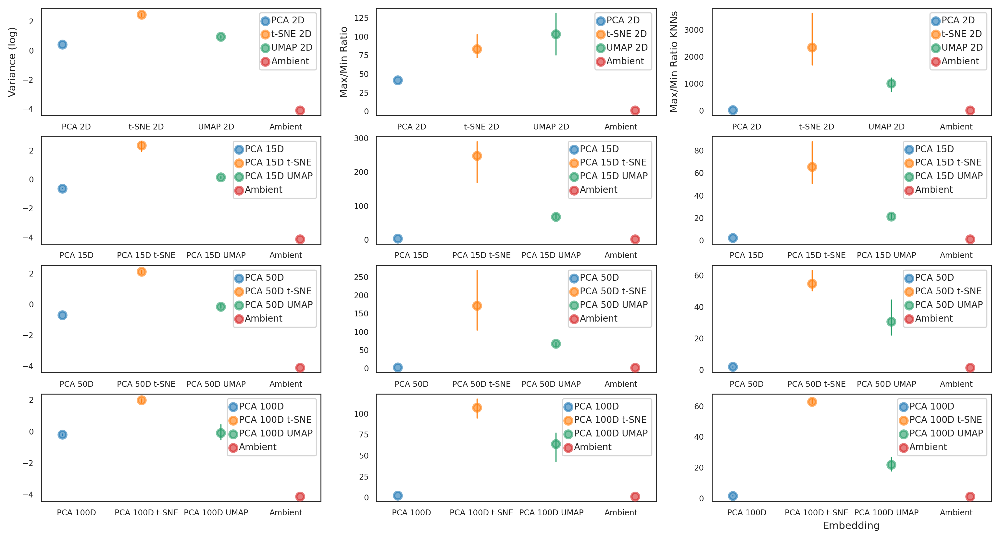

In [ ]:
#tenx plots

fig, ax = plt.subplots(nrows=4, ncols=3,figsize=(15,8))
rows = ['LogVars','Ratio','RatioKNN']
rowNames = ['Variance (log)','Max/Min Ratio','Max/Min Ratio KNNs']
cols = ['2D','15D','50D','100D']

for i in range(len(rows)):

  for j in range(len(cols)):

    colInds = [cols[j] in i or 'Ambient' in i for i in tenxEq['Embed']]
    sub = tenxEq[colInds]


    if j == 0 :
      title = rowNames[i]
    else:
      title = ''

    if j == 3  and i == 2:
      xlab = 'Embedding'
    else:
      xlab = ''
    plotLatentDistorts(ax[j,i],sub,'Embed' ,rows[i],'Embed',xlab = xlab,ylab=title,axisFontSize = 9,tickFontSize = 7)




#plt.xticks(fontsize=5)
plt.show()

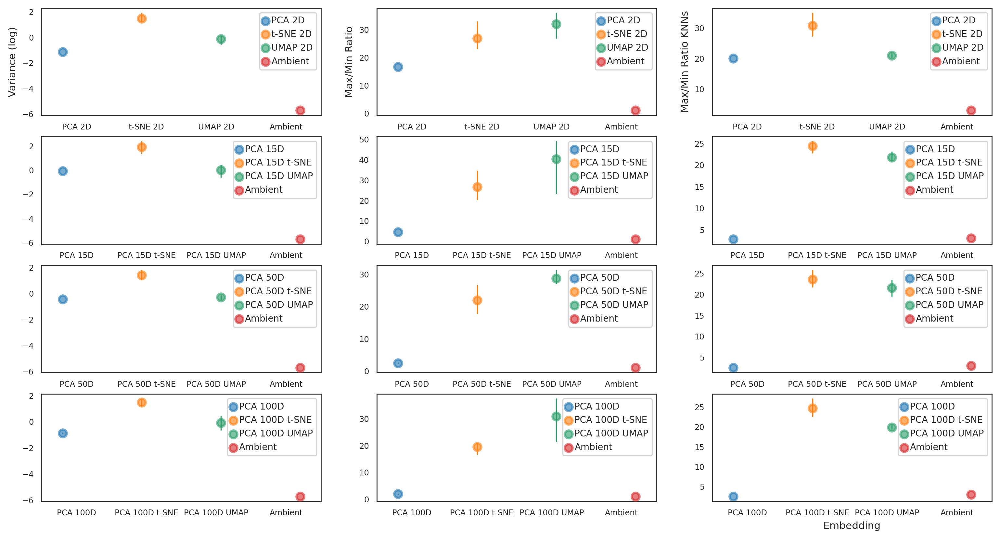

In [ ]:
#utero plots

fig, ax = plt.subplots(nrows=4, ncols=3,figsize=(15,8))
rows = ['LogVars','Ratio','RatioKNN']
rowNames = ['Variance (log)','Max/Min Ratio','Max/Min Ratio KNNs']
cols = ['2D','15D','50D','100D']

for i in range(len(rows)):

  for j in range(len(cols)):

    colInds = [cols[j] in i or 'Ambient' in i for i in uteroEq['Embed']]
    sub = uteroEq[colInds]


    if j == 0 :
      title = rowNames[i]
    else:
      title = ''

    if j == 3  and i == 2:
      xlab = 'Embedding'
    else:
      xlab = ''
    plotLatentDistorts(ax[j,i],sub,'Embed' ,rows[i],'Embed',xlab = xlab,ylab=title,axisFontSize = 9,tickFontSize = 7)




#plt.xticks(fontsize=5)
plt.show()

#### **KNN Jaccard Distances for Latent Spaces**

For each datasets plot jaccard distance histograms for 30 NNs (with respect to ambient)

In [7]:
exAmb = pd.read_csv(data_path+'/exAmb.csv')
exPCAAmb = pd.read_csv(data_path+'/exPCAAmb.csv')

merAmb = pd.read_csv(data_path+'/merAmb.csv')
merPCAAmb = pd.read_csv(data_path+'/merPCAAmb.csv')

tenxAmb = pd.read_csv(data_path+'/tenxAmb.csv')
tenxPCAAmb = pd.read_csv(data_path+'/tenxPCAAmb.csv')

smartAmb = pd.read_csv(data_path+'/smartAmb.csv')
smartPCAAmb = pd.read_csv(data_path+'/smartPCAAmb.csv')

e105Amb = pd.read_csv(data_path+'/e105Amb.csv')
e105PCAAmb = pd.read_csv(data_path+'/e105PCAAmb.csv')

tenxAmb.head()

,Unnamed: 0,x,latent
0,0,0.846154,PCA 15D
1,1,0.867925,PCA 15D
2,2,0.928571,PCA 15D
3,3,0.823529,PCA 15D
4,4,0.947368,PCA 15D


In [8]:
exPicAmb = pd.read_csv(data_path+'/uteroPicAmb.csv')


merPicAmb = pd.read_csv(data_path+'/merPicAmb.csv')


#tenxPicAmb = pd.read_csv(data_path+'/tenxAmb.csv')


smartPicAmb = pd.read_csv(data_path+'/smartPicAmb.csv')

In [9]:
exPicAmb.head()

,Unnamed: 0,x,latent
0,0,0.965517,Flower
1,1,0.983051,Flower
2,2,0.947368,Flower
3,3,0.983051,Flower
4,4,0.928571,Flower


In [10]:
exAmb = pd.concat([exAmb,exPicAmb])
merAmb = pd.concat([merAmb,merPicAmb])
smartAmb = pd.concat([smartAmb,smartPicAmb])


In [11]:
tenxAmb.head()

,Unnamed: 0,x,latent
0,0,0.846154,PCA 15D
1,1,0.867925,PCA 15D
2,2,0.928571,PCA 15D
3,3,0.823529,PCA 15D
4,4,0.947368,PCA 15D


In [12]:
np.unique(tenxAmb.latent)

array(['PCA 100D', 'PCA 100D UMAP', 'PCA 100D t-SNE', 'PCA 15D',
       'PCA 15D UMAP', 'PCA 15D t-SNE', 'PCA 2D', 'PCA 50D',
       'PCA 50D UMAP', 'PCA 50D t-SNE', 'UMAP 2D', 't-SNE 2D'],
      dtype=object)

In [13]:
def plotHists(ax,allVals, x ,hue, xlab='',ylab='',title='', axisFontSize = 11, tickFontSize = 10):
  """ Plot histograms for jaccard distances of nearest neighbors """

  #plt.figure(figsize=figsize)
  #g=sns.ecdfplot(data=allVals, x=x, hue=hue,legend=True,ax=ax) #stat='probability', kde=True,edgecolor="white"
  g=sns.kdeplot(data=allVals, x=x, hue=hue,fill=True,alpha=.5,legend=True,ax=ax)

# sns.kdeplot(
#    data=tips, x="total_bill", hue="size",
#    fill=True, common_norm=False, palette="crest",
#    alpha=.5, linewidth=0,
# )
  #g=sns.displot(data=allVals, x=x, kde=True, hue=hue,edgecolor="white",legend=True,ax=ax) #legend=False

  g.legend(handles=ax.legend_.legend_handles, labels=[t.get_text() for t in ax.legend_.texts],prop={"size":9},loc='upper left')

  g.set_xlim(xmin=0,xmax=1)

  g.set_xlabel(xlab,fontsize=axisFontSize)
  g.set_ylabel(ylab,fontsize=axisFontSize)
  g.set_title(title,fontsize=axisFontSize)

  g.tick_params(labelsize=tickFontSize)

  g.spines['right'].set_visible(False)
  g.spines['top'].set_visible(False)


In [14]:
#utero plots

def plotAmb(amb,ambPCA):
  fig, ax = plt.subplots(nrows=4, ncols=2,figsize=(6,8))
  rows = ['2D','15D','50D','100D']
  #colNames = ['Variance (log)','Max/Min Ratio','Max/Min Ratio KNNs']
  #cols = ['LogVars','Ratio','RatioKNN']


  for i in range(len(rows)):
    if rows[i] == '2D':
      rowInds = [rows[i] in x or 'Elephant' in x or 'Flower' in x for x in amb['latent']]
      sub = amb[rowInds]
    else:
      rowInds = [rows[i] in x for x in amb['latent']]
      sub = amb[rowInds]

    rowInds = [rows[i] in x for x in ambPCA['latent']]
    subPCA = ambPCA[rowInds]


    if i == 0:
      ylab = 'eCDF'
    else:
      ylab= ''

    if i == 3:
      xlab = 'Jaccard Distance (n=30 NNs)'
    else:
      xlab = ''
    
    plotHists(ax[i,0],sub,'x' ,'latent',ylab=ylab,axisFontSize = 9,tickFontSize = 8)
    if i != 0:
      plotHists(ax[i,1],subPCA,'x' ,'latent',xlab=xlab,axisFontSize = 9,tickFontSize = 8)
    else:
      plotHists(ax[i,1],sub,'x' ,'latent',axisFontSize = 9,tickFontSize = 8)




  #plt.xticks(fontsize=5)
  plt.show()

In [15]:
def printAvgs(amb):
  '''Print avgs of all latent spaces for each dataset'''
  l = np.unique(amb.latent)
  d = {}
  for i in l:
    sub = amb[amb['latent'].isin([i])]
    avg = np.mean(sub['x'])
    d[i] = avg

  return d

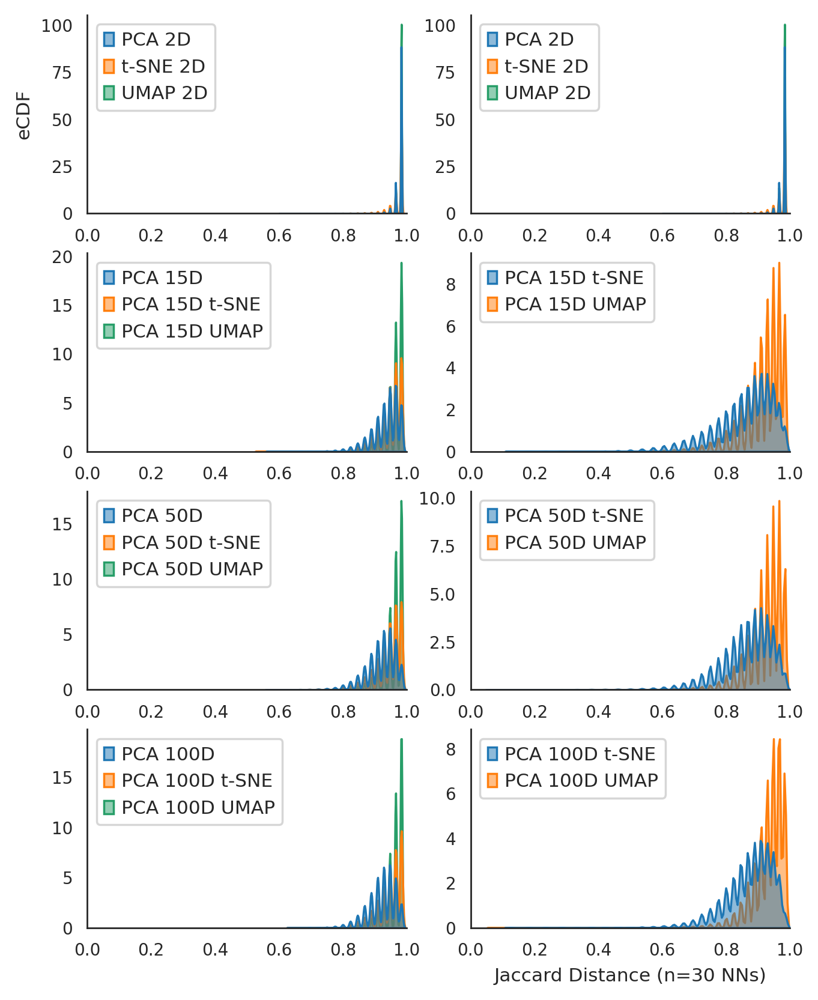

In [ ]:
#tenx data
plotAmb(tenxAmb,tenxPCAAmb)


In [ ]:
print(printAvgs(tenxAmb))
print(printAvgs(tenxPCAAmb))

{'PCA 100D': 0.9228602870895146, 'PCA 100D UMAP': 0.9607088015593441, 'PCA 100D t-SNE': 0.9459647212869273, 'PCA 15D': 0.9345464457487449, 'PCA 15D UMAP': 0.9605768232659531, 'PCA 15D t-SNE': 0.947561700348727, 'PCA 2D': 0.9786802934524483, 'PCA 50D': 0.9201347866079193, 'PCA 50D UMAP': 0.958360804603616, 'PCA 50D t-SNE': 0.9427389206845288, 'UMAP 2D': 0.9792248834164557, 't-SNE 2D': 0.9739485043845159}
{'PCA 100D UMAP': 0.9318277934447097, 'PCA 100D t-SNE': 0.8748506864152963, 'PCA 15D UMAP': 0.9188840638076167, 'PCA 15D t-SNE': 0.8613627891814575, 'PCA 50D UMAP': 0.9249747534127433, 'PCA 50D t-SNE': 0.8677244618809434}


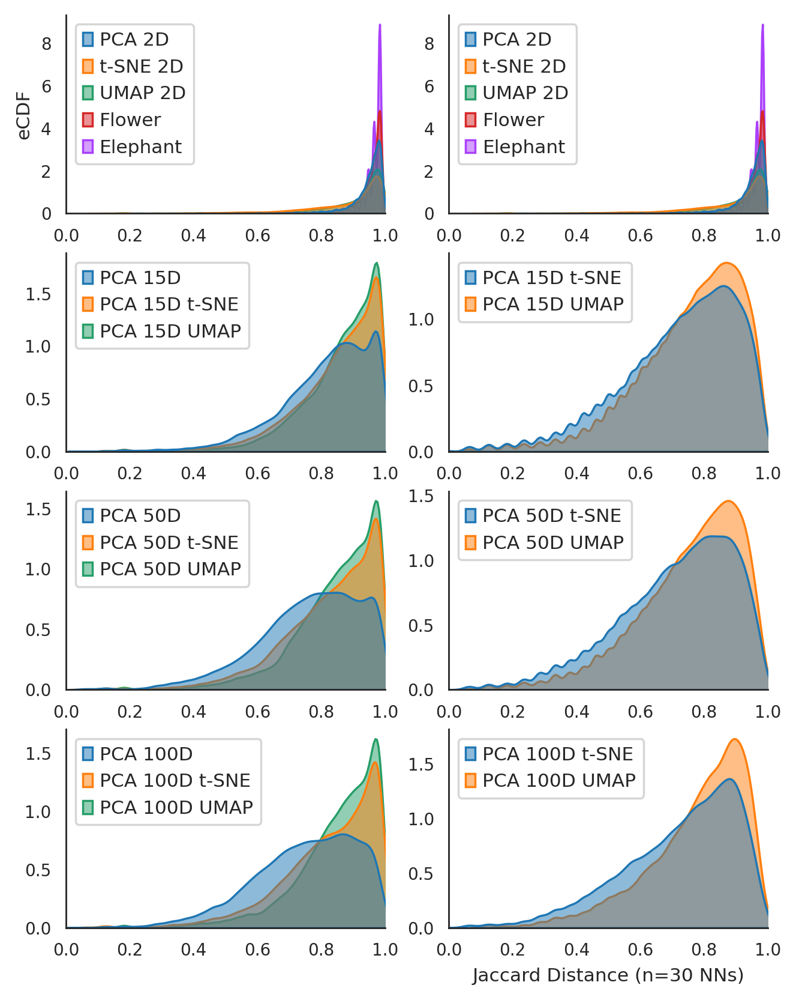

In [ ]:
#ex utero E8.5 data
plotAmb(exAmb,exPCAAmb)

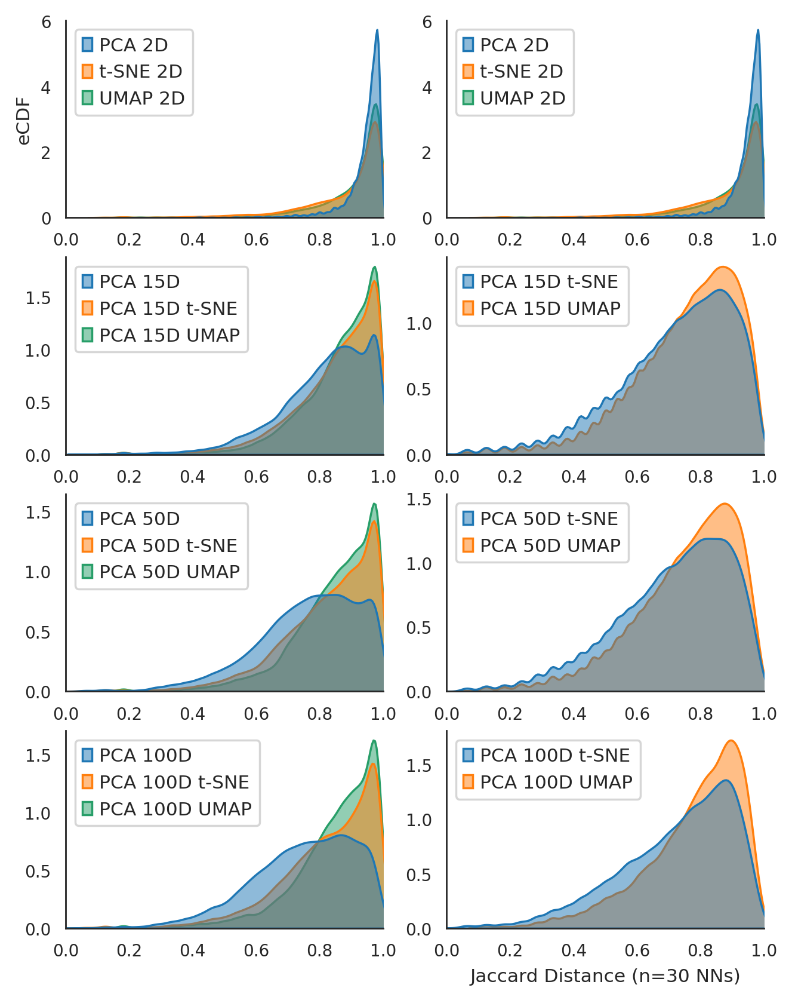

In [ ]:
plotAmb(exAmb[~exAmb.latent.isin(['Flower','Elephant'])],exPCAAmb[~exPCAAmb.latent.isin(['Flower','Elephant'])] ) 

In [ ]:
print(printAvgs(exAmb))
print(printAvgs(exPCAAmb))

{'Elephant': 0.9642969419476453, 'Flower': 0.9511561568221514, 'PCA 100D': 0.7489770718747455, 'PCA 100D UMAP': 0.8488298211505428, 'PCA 100D t-SNE': 0.8240911245640392, 'PCA 15D': 0.8150180976149803, 'PCA 15D UMAP': 0.8598376240768056, 'PCA 15D t-SNE': 0.8480280029024719, 'PCA 2D': 0.9427829222053788, 'PCA 50D': 0.7634996912878929, 'PCA 50D UMAP': 0.8449389567861676, 'PCA 50D t-SNE': 0.8262282492992935, 'UMAP 2D': 0.9042937058110263, 't-SNE 2D': 0.8864039083639175}
{'PCA 100D UMAP': 0.7752397654751021, 'PCA 100D t-SNE': 0.723520811154549, 'PCA 15D UMAP': 0.7540449434399, 'PCA 15D t-SNE': 0.7233931837249579, 'PCA 50D UMAP': 0.7523220558817099, 'PCA 50D t-SNE': 0.7118918734884968}


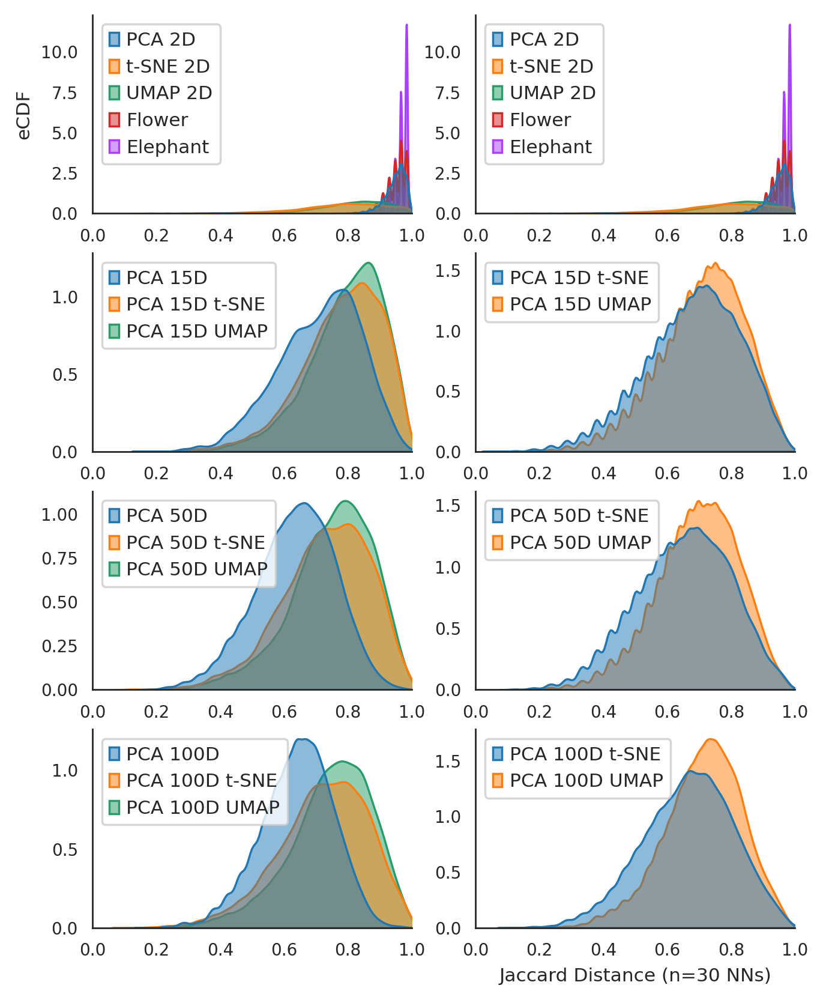

In [ ]:
#smartseq data
plotAmb(smartAmb,smartPCAAmb)

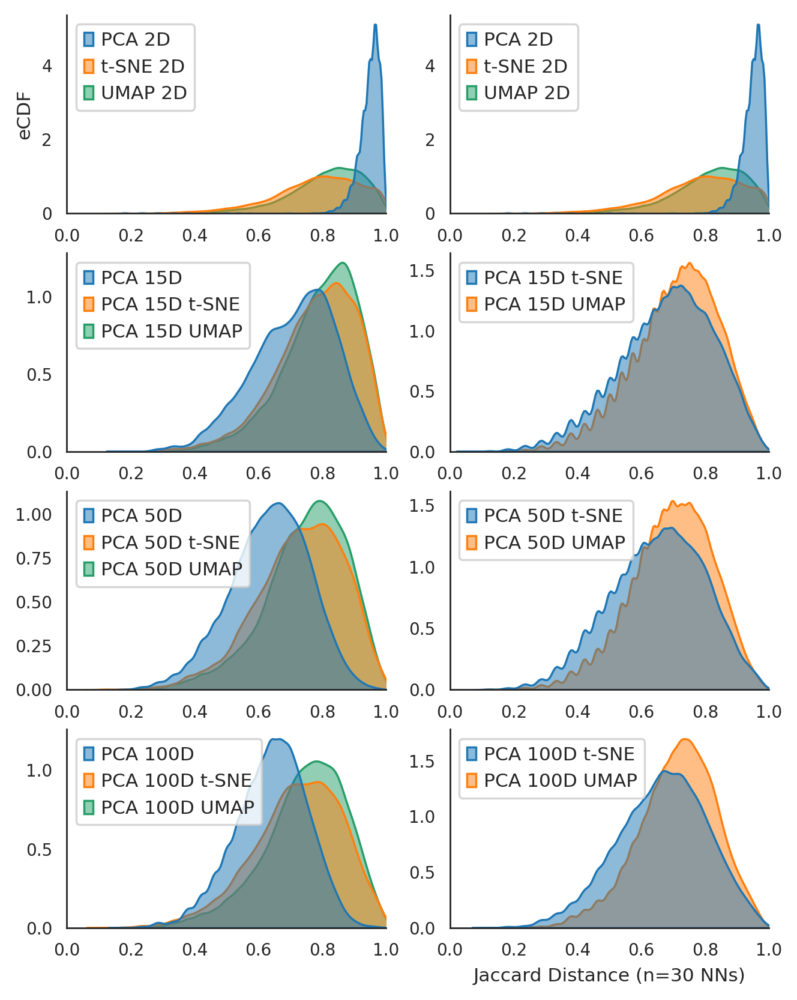

In [ ]:
plotAmb(smartAmb[~smartAmb.latent.isin(['Flower','Elephant'])],smartPCAAmb[~smartPCAAmb.latent.isin(['Flower','Elephant'])] ) 

In [ ]:
print(printAvgs(smartAmb))
print(printAvgs(smartPCAAmb))

{'Elephant': 0.9671141608818008, 'Flower': 0.9497217201421088, 'PCA 100D': 0.6395999997763556, 'PCA 100D UMAP': 0.7456932913507283, 'PCA 100D t-SNE': 0.7208679679270914, 'PCA 15D': 0.7104592375419093, 'PCA 15D UMAP': 0.7927269373200613, 'PCA 15D t-SNE': 0.7811196404131421, 'PCA 2D': 0.9455147326976333, 'PCA 50D': 0.6341988817684663, 'PCA 50D UMAP': 0.7489009159126752, 'PCA 50D t-SNE': 0.7301141956587792, 'UMAP 2D': 0.8116848595387169, 't-SNE 2D': 0.7846285907568784}
{'PCA 100D UMAP': 0.7108530036748045, 'PCA 100D t-SNE': 0.6639375627500649, 'PCA 15D UMAP': 0.7081741788750257, 'PCA 15D t-SNE': 0.6786105060195176, 'PCA 50D UMAP': 0.6936832329524347, 'PCA 50D t-SNE': 0.6506154750607241}


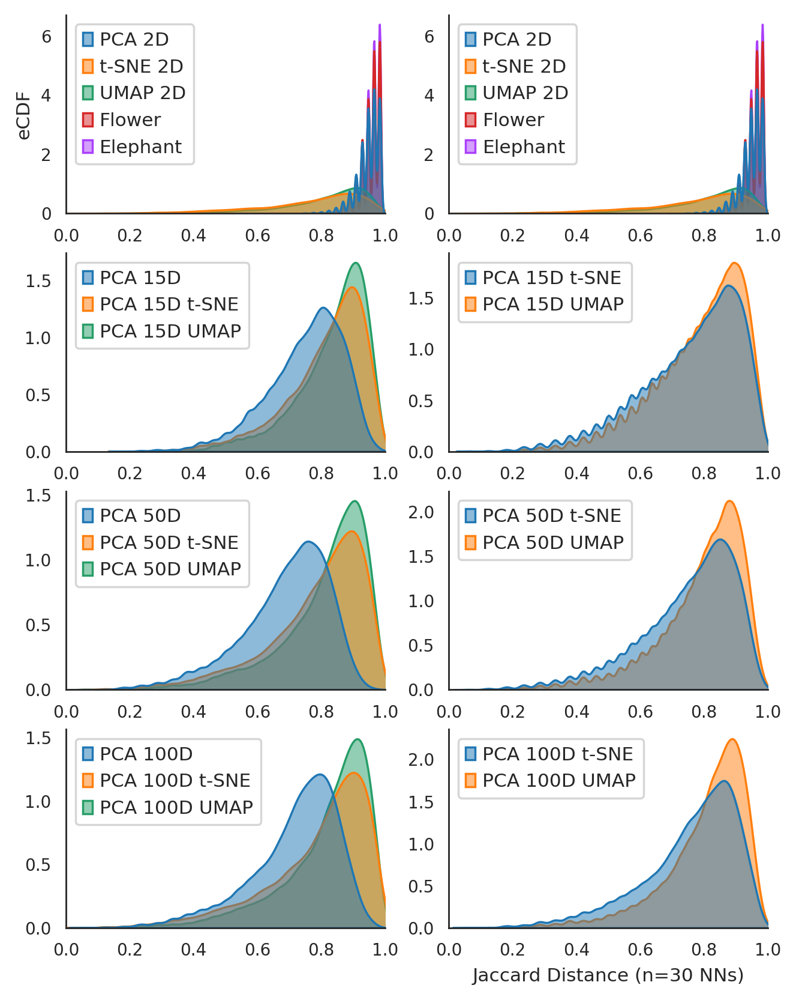

In [ ]:
#merfish data
plotAmb(merAmb,merPCAAmb)

In [ ]:
print(printAvgs(merAmb))
print(printAvgs(merPCAAmb))

{'Elephant': 0.9559041910951691, 'Flower': 0.9542132317046162, 'PCA 100D': 0.7166232565846733, 'PCA 100D UMAP': 0.816403894858118, 'PCA 100D t-SNE': 0.7893364343929254, 'PCA 15D': 0.7495965384533781, 'PCA 15D UMAP': 0.8328450126995068, 'PCA 15D t-SNE': 0.8137837220719755, 'PCA 2D': 0.9471496075465717, 'PCA 50D': 0.6876863113444273, 'PCA 50D UMAP': 0.810114278435265, 'PCA 50D t-SNE': 0.785027317896734, 'UMAP 2D': 0.8071193657005589, 't-SNE 2D': 0.7675909478339572}
{'PCA 100D UMAP': 0.8048546180753704, 'PCA 100D t-SNE': 0.7553722999566564, 'PCA 15D UMAP': 0.7850764918849646, 'PCA 15D t-SNE': 0.7580148683617421, 'PCA 50D UMAP': 0.7921086712131862, 'PCA 50D t-SNE': 0.7478745558090856}


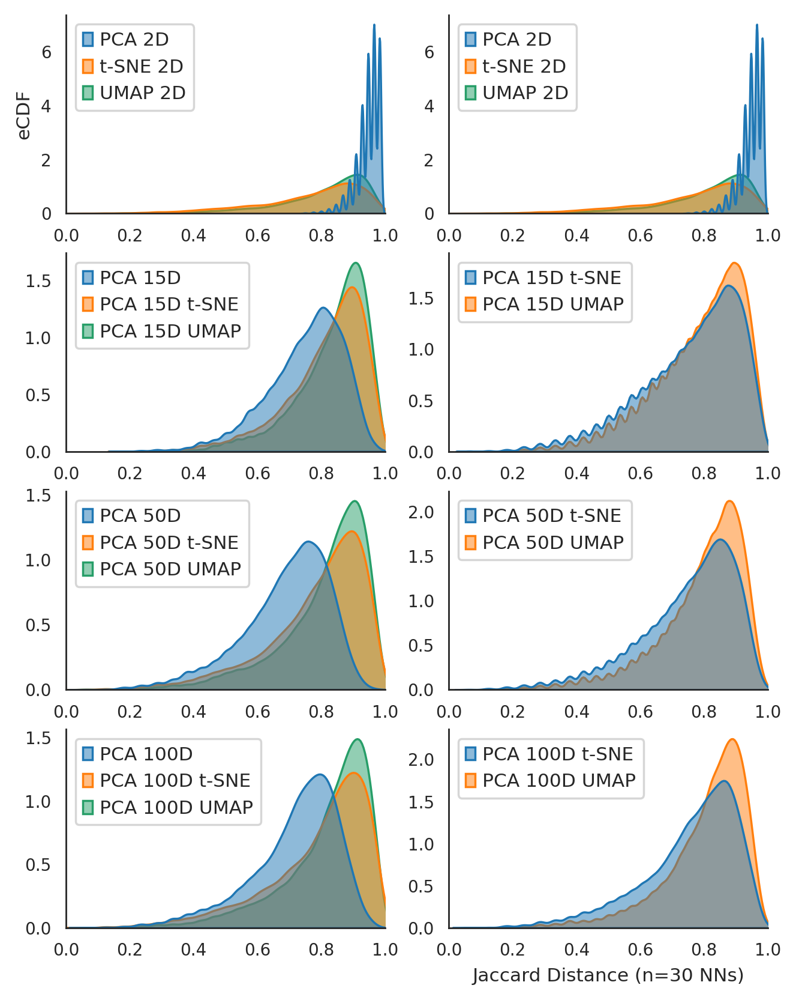

In [ ]:
plotAmb(merAmb[~merAmb.latent.isin(['Flower','Elephant'])],merPCAAmb[~merPCAAmb.latent.isin(['Flower','Elephant'])] ) 

**Make plots over number of cells (datasets) and k neighbors in jaccard calculation**

First plot jaccard distance over datasets with different ks

In [16]:
#Maybe add number of cells below
def plot_overKs(sub):
  plt.figure(figsize=figsize)
  hue_order=[5,  15,  50, 100]
  g=sns.violinplot(x='Dataset', y='x', data=sub, hue='k',width=0.8,palette= 'Blues',linewidth=1,inner="box",hue_order=hue_order,order=[ 'Mouse ESCs with DMSO\n(904 cells)',
                                                                                                    'Mouse NSCs 96-plex\n(21,232 cells)', 
                                                                                                    'SMART-seq Mouse VMH Neurons\n(3,850 cells)',
                                                                                                    '10x Mouse VMH Neurons\n(41,580 cells)'])

  #plt.setp(g.collections, alpha=.6) #for the markers
  plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8},ncol=4)
  

  plt.ylim(ymin=0,ymax=1.0)

  plt.xlabel("Dataset",fontsize=axisFontSize)
  plt.ylabel("Jaccard Distance (k NNs)",fontsize=axisFontSize)
  plt.xticks(fontsize=tickFontSize)
  plt.yticks(fontsize=tickFontSize)
  plt.tight_layout()
  plt.show()

In [17]:
multPCA_ks = pd.read_csv(data_path+'/multPCAAmb_ks.csv')
mult_ks = pd.read_csv(data_path+'/multAmb_ks.csv')

desai_ks = pd.read_csv(data_path+'/desaiAmb_ks.csv')
desaiPCA_ks = pd.read_csv(data_path+'/desaiPCAAmb_ks.csv')

tenx_ks = pd.read_csv(data_path+'/tenxAmb_ks.csv')
tenxPCA_ks = pd.read_csv(data_path+'/tenxPCAAmb_ks.csv')

smart_ks = pd.read_csv(data_path+'/smartAmb_ks.csv')
smartPCA_ks = pd.read_csv(data_path+'/smartPCAAmb_ks.csv')

tenx_ks.head()

,Unnamed: 0,x,latent,k
0,0,0.888889,PCA 50D,5
1,1,0.888889,PCA 50D,5
2,2,0.750000,PCA 50D,5
3,3,0.888889,PCA 50D,5
4,4,0.888889,PCA 50D,5


In [18]:
multPCA_ks['Dataset'] = ['Mouse NSCs 96-plex\n(21,232 cells)']*len(multPCA_ks.latent)
mult_ks['Dataset'] = ['Mouse NSCs 96-plex\n(21,232 cells)']*len(mult_ks.latent)

desai_ks['Dataset'] = ['Mouse ESCs with DMSO\n(904 cells)']*len(desai_ks.latent)
desaiPCA_ks['Dataset'] = ['Mouse ESCs with DMSO\n(904 cells)']*len(desaiPCA_ks.latent)

tenx_ks['Dataset'] = ['10x Mouse VMH Neurons\n(41,580 cells)']*len(tenx_ks.latent)
tenxPCA_ks['Dataset'] = ['10x Mouse VMH Neurons\n(41,580 cells)']*len(tenxPCA_ks.latent)

smart_ks['Dataset'] = ['SMART-seq Mouse VMH Neurons\n(3,850 cells)']*len(smart_ks.latent)
smartPCA_ks['Dataset'] = ['SMART-seq Mouse VMH Neurons\n(3,850 cells)']*len(smartPCA_ks.latent)

In [19]:
all_ks = pd.concat([mult_ks,desai_ks,tenx_ks,smart_ks])
allPCA_ks = pd.concat([multPCA_ks,desaiPCA_ks,tenxPCA_ks,smartPCA_ks])
allPCA_ks.head()

,Unnamed: 0,x,latent,k,Dataset
0,0,0.750000,PCA 50D t-SNE,5,"Mouse NSCs 96-plex\n(21,232 cells)"
1,1,0.750000,PCA 50D t-SNE,5,"Mouse NSCs 96-plex\n(21,232 cells)"
2,2,0.750000,PCA 50D t-SNE,5,"Mouse NSCs 96-plex\n(21,232 cells)"
3,3,0.571429,PCA 50D t-SNE,5,"Mouse NSCs 96-plex\n(21,232 cells)"
4,4,0.888889,PCA 50D t-SNE,5,"Mouse NSCs 96-plex\n(21,232 cells)"


[  5  15  50 100]


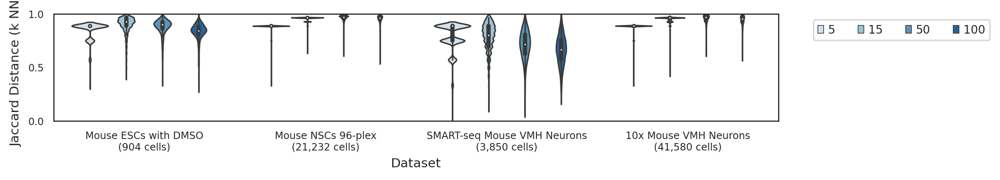

In [31]:
axisFontSize = 9
tickFontSize = 7
errwidth=1
figsize =(10,2)
dodge=0.4

sub = all_ks[all_ks.latent.isin(['PCA 50D UMAP'])]
print(np.unique(sub.k))
plot_overKs(sub)

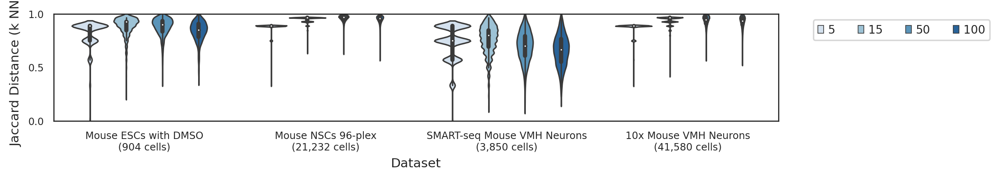

In [24]:
sub = all_ks[all_ks.latent.isin(['PCA 50D t-SNE'])]

plot_overKs(sub)

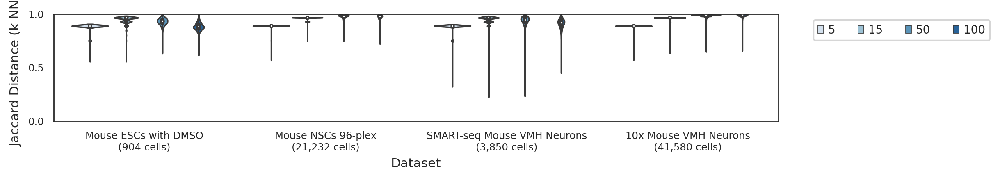

In [25]:
sub = all_ks[all_ks.latent.isin(['UMAP 2D'])]

plot_overKs(sub)

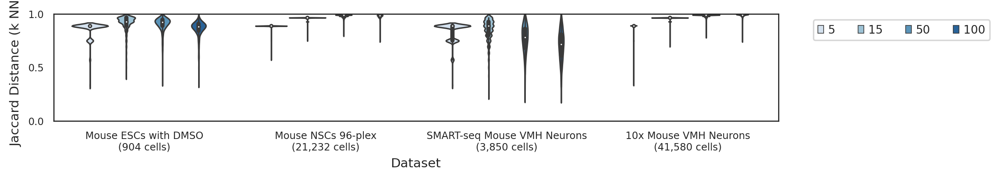

In [26]:
sub = all_ks[all_ks.latent.isin(['t-SNE 2D'])]

plot_overKs(sub)

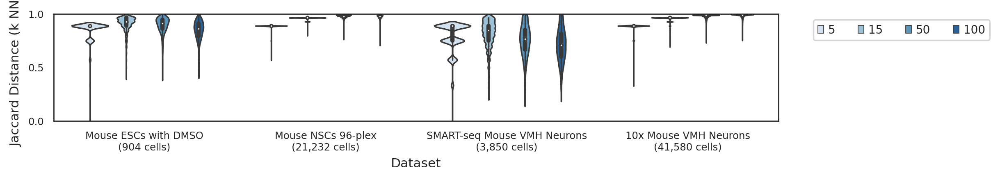

In [32]:
sub = all_ks[all_ks.latent.isin(['PCA 2D'])]

plot_overKs(sub)

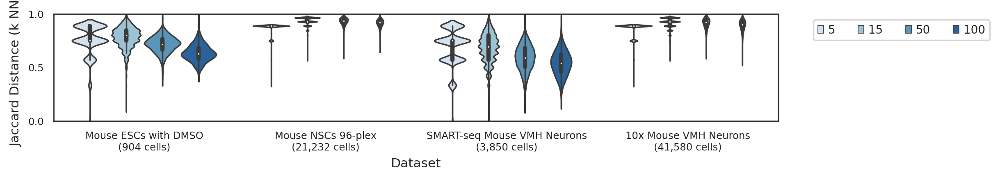

In [27]:
sub = all_ks[all_ks.latent.isin(['PCA 50D'])]

plot_overKs(sub)

In [28]:
#PCA vs 2D embedding of PCA below

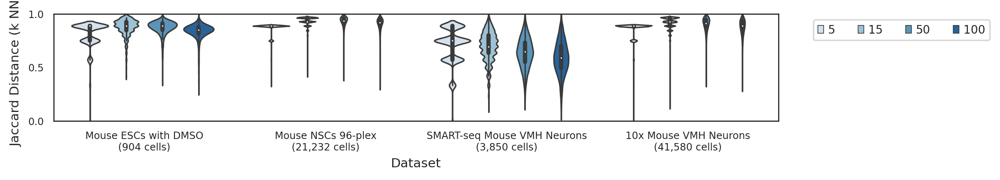

In [29]:
sub = allPCA_ks[allPCA_ks.latent.isin(['PCA 50D UMAP'])]

plot_overKs(sub)

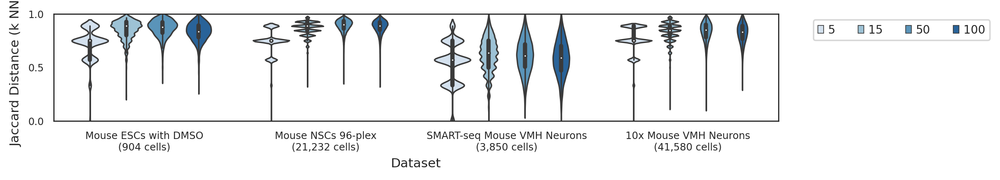

In [30]:
sub = allPCA_ks[allPCA_ks.latent.isin(['PCA 50D t-SNE'])]

plot_overKs(sub)

Plot over number of cells

In [ ]:
exAmb['Dataset'] = ['Ex Utero E8.5 Embryo\n(6,205 cells)']*len(exAmb.latent)
exPCAAmb['Dataset'] = ['Ex Utero E8.5 Embryo\n(6,205 cells)']*len(exPCAAmb.latent)

merAmb['Dataset'] = ['MERFISH MOp\n(6,963 cells)']*len(merAmb.latent)
merPCAAmb['Dataset'] = ['MERFISH MOp\n(6,963 cells)']*len(merPCAAmb.latent)

e105Amb['Dataset'] = ['Ex and In Utero E10.5 Embryo\n(56,528 cells)']*len(e105Amb.latent)
e105PCAAmb['Dataset'] = ['Ex and In Utero E10.5 Embryo\n(56,528 cells)']*len(e105PCAAmb.latent)


new_df = pd.DataFrame()
new_df['x'] = list(exAmb[exAmb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].x)+list(merAmb[merAmb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].x)+list(e105Amb[e105Amb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].x)
new_df['latent'] = list(exAmb[exAmb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].latent)+list(merAmb[merAmb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].latent)+list(e105Amb[e105Amb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].latent)
new_df['Dataset'] = list(exAmb[exAmb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].Dataset)+list(merAmb[merAmb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].Dataset)+list(e105Amb[e105Amb.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])].Dataset)

new_df.head()



,x,latent,Dataset
0,0.800000,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
1,0.909091,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
2,0.723404,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
3,0.695652,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
4,0.983051,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"


In [ ]:
final_df = pd.DataFrame()
final_df['x'] = list(new_df['x'])+list(all_ks[all_ks.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE']) & all_ks.k.isin([50])].x)
final_df['latent'] = list(new_df['latent'])+list(all_ks[all_ks.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE']) & all_ks.k.isin([50])].latent)
final_df['Dataset'] = list(new_df['Dataset'])+list(all_ks[all_ks.latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE']) & all_ks.k.isin([50])].Dataset)

final_df.head()

,x,latent,Dataset
0,0.800000,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
1,0.909091,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
2,0.723404,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
3,0.695652,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"
4,0.983051,PCA 50D,"Ex Utero E8.5 Embryo\n(6,205 cells)"


In [ ]:
print(np.unique(final_df.Dataset))

['10x Mouse VMH Neurons\n(41,580 cells)'
 'Ex Utero E8.5 Embryo\n(6,205 cells)'
 'Ex and In Utero E10.5 Embryo\n(56,528 cells)'
 'MERFISH MOp\n(6,963 cells)' 'Mouse ESCs with DMSO\n(904 cells)'
 'Mouse NSCs 96-plex\n(21,232 cells)'
 'SMART-seq Mouse VMH Neurons\n(3,850 cells)']


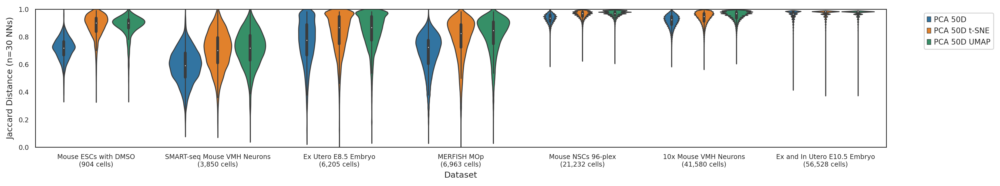

In [ ]:
#PCA 50d, t-sne, umap over datasets
figsize=(15,3)
plt.figure(figsize=figsize)
hue_order=[5,  15,  50, 100]
g=sns.violinplot(x='Dataset', y='x', data=final_df, hue='latent',width=0.8,linewidth=1,inner="box",order=[ 'Mouse ESCs with DMSO\n(904 cells)',
                                                                                                                                               'SMART-seq Mouse VMH Neurons\n(3,850 cells)',
                                                                                                                                               'Ex Utero E8.5 Embryo\n(6,205 cells)',
                                                                                                                                               'MERFISH MOp\n(6,963 cells)',
                                                                                                                                               'Mouse NSCs 96-plex\n(21,232 cells)',
                                                                                                                                               '10x Mouse VMH Neurons\n(41,580 cells)',
                                                                                                                                               'Ex and In Utero E10.5 Embryo\n(56,528 cells)'])

#plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax=1.0)

plt.xlabel("Dataset",fontsize=axisFontSize)
plt.ylabel("Jaccard Distance (n=30 NNs)",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

In [ ]:
#

### **Inter/Intra Distance Trends Across Datasets**

In [ ]:
#Read in Gehring, popalign, smart-seq, 10x vmh, merfish,ex e8.5
allNeigh_96plex = pd.read_csv(data_path+'/allneigh_96plex.csv')
allNeigh_96plex['Dataset'] = ['Mouse NSCs 96-plex\n(21,232 cells)']*len(allNeigh_96plex.Latent)
d50_96plex = pd.read_csv(data_path+'/d50_96plex.csv')
d50_96plex['Dataset'] = ['Mouse NSCs 96-plex\n(21,232 cells)']*len(d50_96plex.Latent)
allVals_96plex = pd.read_csv(data_path+'/allVals_96plex.csv')
allVals_96plex['Dataset'] = ['Mouse NSCs 96-plex\n(21,232 cells)']*len(allVals_96plex.Latent)


allNeigh_mono = pd.read_csv(data_path+'/allNeigh_mono.csv')
allNeigh_mono['Dataset'] = ['Human Monocytes Drug Combo\n(29,360 cells)']*len(allNeigh_mono.Latent)
d50_mono = pd.read_csv(data_path+'/d50_mono.csv')
d50_mono['Dataset'] = ['Human Monocytes Drug Combo\n(29,360 cells)']*len(d50_mono.Latent)
allVals_mono = pd.read_csv(data_path+'/allVals_mono.csv')
allVals_mono['Dataset'] = ['Human Monocytes Drug Combo\n(29,360 cells)']*len(allVals_mono.Latent)

allNeigh_smartseq = pd.read_csv(data_path+'/allNeigh_smartseq.csv')
allNeigh_smartseq['Dataset'] = ['SMART-seq Mouse VMH Neurons\n(3,850 cells)']*len(allNeigh_smartseq.Latent)
d50_smartseq = pd.read_csv(data_path+'/d50_smartseq.csv')
d50_smartseq['Dataset'] = ['SMART-seq Mouse VMH Neurons\n(3,850 cells)']*len(d50_smartseq.Latent)
allVals_smartseq = pd.read_csv(data_path+'/allVals_smartseq.csv')
allVals_smartseq['Dataset'] = ['SMART-seq Mouse VMH Neurons\n(3,850 cells)']*len(allVals_smartseq.Latent)

allNeigh_10x = pd.read_csv(data_path+'/allNeigh_10x.csv')
allNeigh_10x['Dataset'] = ['10x Mouse VMH Neurons\n(41,580 cells)']*len(allNeigh_10x.Latent)
d50_10x = pd.read_csv(data_path+'/d50_10x.csv') 
d50_10x['Dataset'] = ['10x Mouse VMH Neurons\n(41,580 cells)']*len(d50_10x.Latent)
allVals_10x = pd.read_csv(data_path+'/allVals_10x.csv')
allVals_10x['Dataset'] = ['10x Mouse VMH Neurons\n(41,580 cells)']*len(allVals_10x.Latent)

allNeigh_merfish = pd.read_csv(data_path+'/allNeigh_merfish.csv') 
allNeigh_merfish['Dataset'] = ['MERFISH MOp\n(6,963 cells)']*len(allNeigh_merfish.Latent)
d50_merfish = pd.read_csv(data_path+'/d50_merfish.csv')
d50_merfish['Dataset'] = ['MERFISH MOp\n(6,963 cells)']*len(d50_merfish.Latent)
allVals_merfish = pd.read_csv(data_path+'/allVals_merfish.csv')
allVals_merfish['Dataset'] = ['MERFISH MOp\n(6,963 cells)']*len(allVals_merfish.Latent)

allNeigh_e85 = pd.read_csv(data_path+'/allNeigh_e85.csv') 
allNeigh_e85['Dataset'] = ['Ex Utero E8.5 Embryo\n(6,205 cells)']*len(allNeigh_e85.Latent)
d50_e85 = pd.read_csv(data_path+'/d50_e85.csv')
d50_e85['Dataset'] = ['Ex Utero E8.5 Embryo\n(6,205 cells)']*len(d50_e85.Latent)
allVals_e85 = pd.read_csv(data_path+'/allVals_e85.csv')
allVals_e85['Dataset'] = ['Ex Utero E8.5 Embryo\n(6,205 cells)']*len(allVals_e85.Latent)

allVals_e85.head()

In [ ]:
# vals = []
# for i in range(len(newVals_smartseq[newVals_smartseq.Latent.isin(['PCA 50D UMAP'])].KS)):
#   val = newVals_smartseq[newVals_smartseq.Latent.isin(['PCA 50D UMAP'])].KS.iloc[i]
#   comma = val.index(',')
#   vals += [float(val[23:comma])]

# np.unique(vals)


array([0.9664903])

In [ ]:
#Combine all Neigh, 'Latent' "Tau"
all_neighs = pd.concat([allNeigh_96plex,allNeigh_mono,allNeigh_smartseq,allNeigh_10x,allNeigh_merfish,allNeigh_e85])
all_neighs = all_neighs[all_neighs.Latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])]

#PCA 50d, t-sne, umap over datasets
figsize=(12,3)
plt.figure(figsize=figsize)
g=sns.violinplot(x='Dataset', y='Tau', data=all_neighs, hue='Latent',width=0.8,linewidth=1,inner="box",order=['SMART-seq Mouse VMH Neurons\n(3,850 cells)',
                                                                                                                                               'Ex Utero E8.5 Embryo\n(6,205 cells)',
                                                                                                                                               'MERFISH MOp\n(6,963 cells)',
                                                                                                                                               'Mouse NSCs 96-plex\n(21,232 cells)',
                                                                                                                                               'Human Monocytes Drug Combo\n(29,360 cells)',
                                                                                                                                               '10x Mouse VMH Neurons\n(41,580 cells)'])

#plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax=1.0)

plt.xlabel("Dataset",fontsize=axisFontSize)
plt.ylabel("Tau",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

In [ ]:
#Combine PCA 50D Comparisons
#Combine all Neigh, 'Latent' "Tau"
all_d50 = pd.concat([d50_96plex,d50_mono,d50_smartseq,d50_10x,d50_merfish,d50_e85])
all_d50 = all_d50[all_d50.Latent.isin(['PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])]

#PCA 50d, t-sne, umap over datasets
figsize=(12,3)
plt.figure(figsize=figsize)
g=sns.violinplot(x='Dataset', y='Tau', data=all_d50, hue='Latent',width=0.8,linewidth=1,inner="box",order=['Mouse NSCs 96-plex\n(21,232 cells)',
                                                                                                              'Human Monocytes Drug Combo\n(29,360 cells)',
                                                                                                              'SMART-seq Mouse VMH Neurons\n(3,850 cells)',
                                                                                                              'Ex Utero E8.5 Embryo\n(6,205 cells)',
                                                                                                              'MERFISH MOp\n(6,963 cells)',
                                                                                                              '10x Mouse VMH Neurons\n(41,580 cells)'])

#plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax=1.0)

plt.xlabel("Dataset",fontsize=axisFontSize)
plt.ylabel("Tau",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

In [ ]:
#Combine KS 'Latent' 'Distance' 'Value' 'KS' (list(sub['KS'])[0])
all_newVals = pd.concat([allVals_96plex,allVals_mono,allVals_smartseq,allVals_10x,allVals_merfish,allVals_e85])
all_newVals = all_newVals[all_newVals.Latent.isin(['Ambient','PCA 50D','PCA 50D UMAP','PCA 50D t-SNE'])]

In [ ]:
datas = []
lats = []
kss = []
for n in np.unique(all_newVals.Dataset):
  sub = all_newVals[all_newVals.Dataset.isin([n])]
  for l in np.unique(all_newVals.Latent):
    sub2 = sub[sub.Latent.isin([l])]
    ks = []
    for i in range(len(sub2.KS)):
      val = sub2.KS.iloc[i]
      comma = val.index(',')
      ks += [float(val[23:comma])]
    all_ks = np.unique(ks)

    kss += [all_ks]
    lats += [l]*len(all_ks)
    datas += [n]*len(all_ks)

ks_res = pd.DataFrame()
ks_res['Dataset'] = datas
ks_res['Latent'] = lats
ks_res['KS'] = kss
ks_res.head()

In [ ]:
#Maybe add number of cells below
# palette={"PCA 100D":sns.color_palette()[0],"SCANVI":sns.color_palette()[1],
#                   "Recon MCML 50D":sns.color_palette()[2],"Cell Type MCML 50D":sns.color_palette()[3],"PCA 50D":sns.color_palette()[4],"netAE":sns.color_palette()[5],
#                   "PCA 50D UMAP Sup.":sns.color_palette()[6],"PCA 50D UMAP":sns.color_palette()[7],
#                   "PCA 50D t-SNE":sns.color_palette()[8]}
figsize=(12,3)
plt.figure(figsize=figsize)
hue_order=['Ambient','PCA 50D','PCA 50D UMAP','PCA 50D t-SNE']
g=sns.pointplot(x='Dataset', y='KS', data=ks_res, hue='Latent',hue_order=hue_order,join=False,errwidth=errwidth, dodge=0.35,order=['Mouse NSCs 96-plex\n(21,232 cells)',
                                                                                                              'Human Monocytes Drug Combo\n(29,360 cells)',
                                                                                                              'SMART-seq Mouse VMH Neurons\n(3,850 cells)',
                                                                                                              'Ex Utero E8.5 Embryo\n(6,205 cells)',
                                                                                                              'MERFISH MOp\n(6,963 cells)',
                                                                                                              '10x Mouse VMH Neurons\n(41,580 cells)']) #err_style='bars', alpha=0.6,
plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax=1.0)

plt.xlabel("Dataset",fontsize=axisFontSize-2)
plt.ylabel("K-S Statistic",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize-0.5)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

### **Prediction and MCML Plots**

In [ ]:
smartPreds = pd.read_csv(data_path+'/allSmartSeqPreds_22.csv')
#netAEpreds = pd.read_csv(data_path+'/netAESmartSeqPreds.csv')
tenxpreds = pd.read_csv(data_path+'/all10XPreds_22.csv')
matlaspreds = pd.read_csv(data_path+'/allLaMannoPreds_22.csv')
multpreds = pd.read_csv(data_path+'/allNSCPreds_22.csv')

tenxpreds.head()

,Unnamed: 0,Accuracy,Embed,Label
0,0,0.791727,LDVAE,CellType1
1,1,0.789723,LDVAE,CellType1
2,2,0.790043,LDVAE,CellType1
3,3,0.791727,SCANVI,CellType1
4,4,0.797739,SCANVI,CellType1


In [ ]:
matlaspreds.head()

,Unnamed: 0,Accuracy,Embed
0,0,0.504060,PCA 50D
1,1,0.503181,PCA 50D
2,2,0.502484,PCA 50D
3,3,0.541287,PCA 100D
4,4,0.541371,PCA 100D


In [ ]:
allPreds = pd.concat([smartPreds, tenxpreds,matlaspreds,multpreds])

In [ ]:
dataset = ['SmartSeq Mouse VMH Neurons']*(len(smartPreds)) + ['10X Mouse VMH Neurons']*len(tenxpreds) + ['10X Developing Mouse Brain']*len(matlaspreds) + ['96-plex']*len(multpreds)
allPreds['Dataset'] = dataset

In [ ]:
subAllPreds = allPreds[~allPreds.Label.isin(['CellType2','Gender2'])]
subAllPreds = subAllPreds[~(subAllPreds.Embed == 'NCA 100% MCML')]

In [ ]:
subAllPreds['Embed'] = [i.replace('NCA-Recon MCML','Cell Type MCML 50D') for i in subAllPreds['Embed']]
subAllPreds['Embed'] = [i.replace('Recon MCML','Recon MCML 50D') for i in subAllPreds['Embed']]

In [ ]:
subAllPreds['Embed'] = [i.replace('PCA UMAP','PCA 50D UMAP') for i in subAllPreds['Embed']]
subAllPreds['Embed'] = [i.replace('PCA t-SNE','PCA 50D t-SNE') for i in subAllPreds['Embed']]
subAllPreds['Embed'] = [i.replace('PCA UMAP Sup.','PCA 50D UMAP Sup.') for i in subAllPreds['Embed']]

In [ ]:
subAllPreds['Dataset'] = [i.replace('SmartSeq Mouse VMH Neurons','SMART-seq Mouse VMH Neurons\n(3,850 cells)') for i in subAllPreds['Dataset']] 
subAllPreds['Dataset'] = [i.replace('10X Mouse VMH Neurons','10x Mouse VMH Neurons\n(41,580 cells)') for i in subAllPreds['Dataset']] 
subAllPreds['Dataset'] = [i.replace('10X Developing Mouse Brain','10x Developing Mouse Brain\n(292,495 cells)') for i in subAllPreds['Dataset']]
subAllPreds['Dataset'] = [i.replace('96-plex','Mouse NSCs 96-plex\n(21,232 cells)') for i in subAllPreds['Dataset']]

In [ ]:
subAllPreds = subAllPreds[~(subAllPreds.Embed.isin(['NCA 100% MCML','Cell Type MCML 50D','Recon MCML 50D','LDVAE','SCANVI']))]

In [ ]:
axisFontSize = 9
tickFontSize = 7
errwidth=1
figsize =(8,3)
dodge=0.4

In [ ]:
np.unique(subAllPreds.Embed)

array(['HPF 30D', 'HPF 96D', 'HPF30 UMAP', 'HPF30 UMAP Sup.',
       'HPF30 t-SNE', 'HPF96 UMAP', 'HPF96 UMAP Sup.', 'HPF96 t-SNE',
       'PCA 100D', 'PCA 40D', 'PCA 40D UMAP', 'PCA 40D UMAP Sup.',
       'PCA 40D t-SNE', 'PCA 50D', 'PCA 50D UMAP', 'PCA 50D UMAP Sup.',
       'PCA 50D t-SNE'], dtype=object)

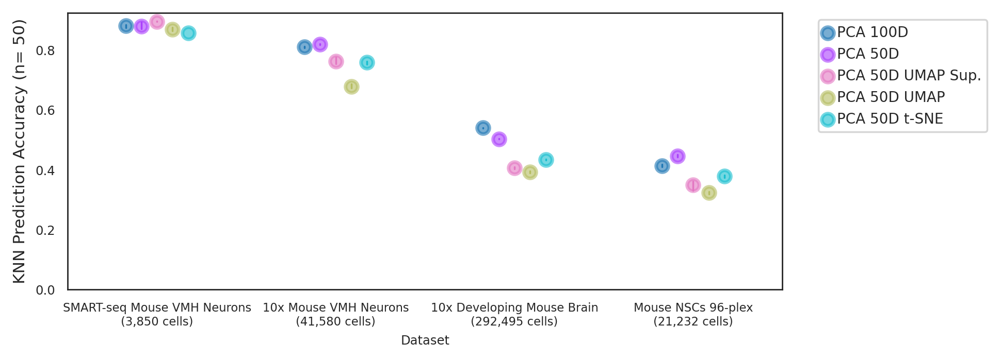

In [ ]:
#Maybe add number of cells below
palette={"PCA 100D":sns.color_palette()[0],"SCANVI":sns.color_palette()[1],
                  "Recon MCML 50D":sns.color_palette()[2],"Cell Type MCML 50D":sns.color_palette()[3],"PCA 50D":sns.color_palette()[4],"netAE":sns.color_palette()[5],
                  "PCA 50D UMAP Sup.":sns.color_palette()[6],"PCA 50D UMAP":sns.color_palette()[7],
                  "PCA 50D t-SNE":sns.color_palette()[8]}

plt.figure(figsize=figsize)
hue_order=['PCA 100D','PCA 50D','PCA 50D UMAP Sup.','PCA 50D UMAP','PCA 50D t-SNE']
g=sns.pointplot(x='Dataset', y='Accuracy', data=subAllPreds, hue='Embed',palette= palette,hue_order=hue_order,join=False,errwidth=errwidth, dodge=0.35) #err_style='bars', alpha=0.6,
plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax =1.0)

plt.xlabel("Dataset",fontsize=axisFontSize-2)
plt.ylabel("KNN Prediction Accuracy (n= 50)",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize-0.5)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

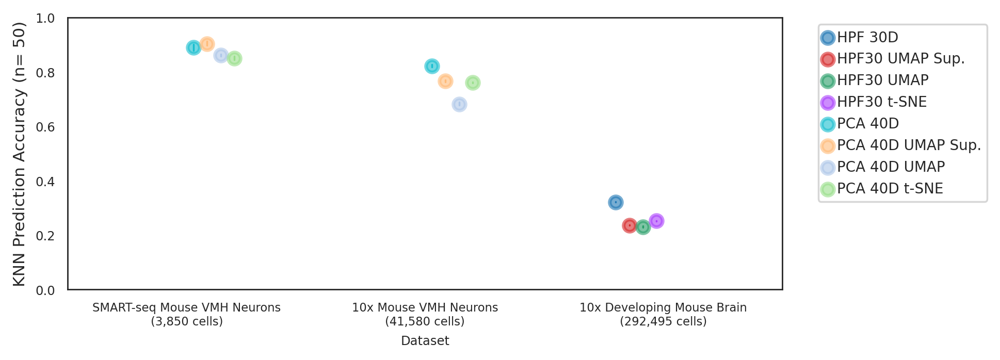

In [ ]:
#Maybe add number of cells below
sub = subAllPreds[~subAllPreds.Dataset.isin(['Mouse NSCs 96-plex\n(21,232 cells)'])]
palette={'HPF 30D':sns.color_palette()[0],'HPF 96D':sns.color_palette()[1],
                  "HPF30 UMAP":sns.color_palette()[2],'HPF30 UMAP Sup.':sns.color_palette()[3],'HPF30 t-SNE':sns.color_palette()[4],'HPF96 UMAP':sns.color_palette()[5],
                  'HPF96 UMAP Sup.':sns.color_palette()[6],'HPF96 t-SNE':sns.color_palette()[7],
                  'PCA 40D':sns.color_palette()[8],'PCA 40D UMAP':sns.color_palette()[9],'PCA 40D UMAP Sup.':sns.color_palette()[10],'PCA 40D t-SNE':sns.color_palette()[11]}


plt.figure(figsize=figsize)
hue_order=['HPF 30D','HPF30 UMAP Sup.',"HPF30 UMAP",'HPF30 t-SNE','PCA 40D','PCA 40D UMAP Sup.','PCA 40D UMAP','PCA 40D t-SNE']
g=sns.pointplot(x='Dataset', y='Accuracy', data=sub, hue='Embed',palette= palette,hue_order=hue_order,join=False,errwidth=errwidth, dodge=0.4) #err_style='bars', alpha=0.6,
plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax =1.0)

plt.xlabel("Dataset",fontsize=axisFontSize-2)
plt.ylabel("KNN Prediction Accuracy (n= 50)",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize-0.5)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

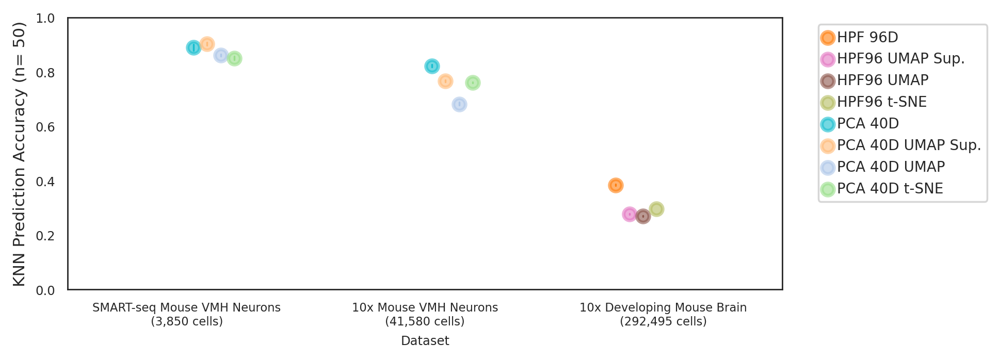

In [ ]:
#Maybe add number of cells below
sub = subAllPreds[~subAllPreds.Dataset.isin(['Mouse NSCs 96-plex\n(21,232 cells)'])]
palette={'HPF 30D':sns.color_palette()[0],'HPF 96D':sns.color_palette()[1],
                  "HPF30 UMAP":sns.color_palette()[2],'HPF30 UMAP Sup.':sns.color_palette()[3],'HPF30 t-SNE':sns.color_palette()[4],'HPF96 UMAP':sns.color_palette()[5],
                  'HPF96 UMAP Sup.':sns.color_palette()[6],'HPF96 t-SNE':sns.color_palette()[7],
                  'PCA 40D':sns.color_palette()[8],'PCA 40D UMAP':sns.color_palette()[9],'PCA 40D UMAP Sup.':sns.color_palette()[10],'PCA 40D t-SNE':sns.color_palette()[11]}


plt.figure(figsize=figsize)
hue_order=['HPF 96D','HPF96 UMAP Sup.',"HPF96 UMAP",'HPF96 t-SNE','PCA 40D','PCA 40D UMAP Sup.','PCA 40D UMAP','PCA 40D t-SNE']
g=sns.pointplot(x='Dataset', y='Accuracy', data=sub, hue='Embed',palette= palette,hue_order=hue_order,join=False,errwidth=errwidth, dodge=0.4) #err_style='bars', alpha=0.6,
plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax =1.0)

plt.xlabel("Dataset",fontsize=axisFontSize-2)
plt.ylabel("KNN Prediction Accuracy (n= 50)",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize-0.5)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

In [ ]:
#Maybe add number of cells below
palette={"PCA 100D":sns.color_palette()[0],"SCANVI":sns.color_palette()[1],
                  "Recon MCML 50D":sns.color_palette()[2],"Cell Type MCML 50D":sns.color_palette()[3],"PCA 50D":sns.color_palette()[4],"netAE":sns.color_palette()[5],
                  "PCA 50D UMAP Sup.":sns.color_palette()[6],"PCA 50D UMAP":sns.color_palette()[7],
                  "PCA 50D t-SNE":sns.color_palette()[8]}

plt.figure(figsize=figsize)
hue_order=['PCA 100D','PCA 50D','PCA 50D UMAP Sup.','PCA 50D UMAP','PCA 50D t-SNE']
g=sns.pointplot(x='Dataset', y='Accuracy', data=subAllPreds, hue='Embed',palette= palette,hue_order=hue_order,join=False,errwidth=errwidth, dodge=0.35) #err_style='bars', alpha=0.6,
plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0,ymax =1.0)

plt.xlabel("Dataset",fontsize=axisFontSize-2)
plt.ylabel("KNN Prediction Accuracy (n= 50)",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize-0.5)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

MCML Labeled Neighbor Fractions

In [ ]:
mcmlNeigh = pd.read_csv(data_path+'/neighFrac_mcml.csv')

In [ ]:
mcmlNeigh.head()

,Unnamed: 0,Condition,Sex,latent
0,0,0.200000,0.666667,LDVAE-50D
1,1,0.133333,0.933333,LDVAE-50D
2,2,0.066667,1.000000,LDVAE-50D
3,3,0.300000,0.466667,LDVAE-50D
4,4,0.133333,0.800000,LDVAE-50D


In [ ]:
np.unique(mcmlNeigh.latent)

array(['Condition-Sex MCML-50D (Full)', 'Condition-Sex MCML-50D (Ref.)',
       'LDVAE-50D', 'PCA-100D', 'PCA-50D', 'Recon MCML-50D', 'SCANVI-50D'],
      dtype=object)

In [ ]:
axisFontSize = 9
tickFontSize = 7
errwidth=1
# figsize =(5,15)
dodge=0.4

<Figure size 625x1875 with 0 Axes>

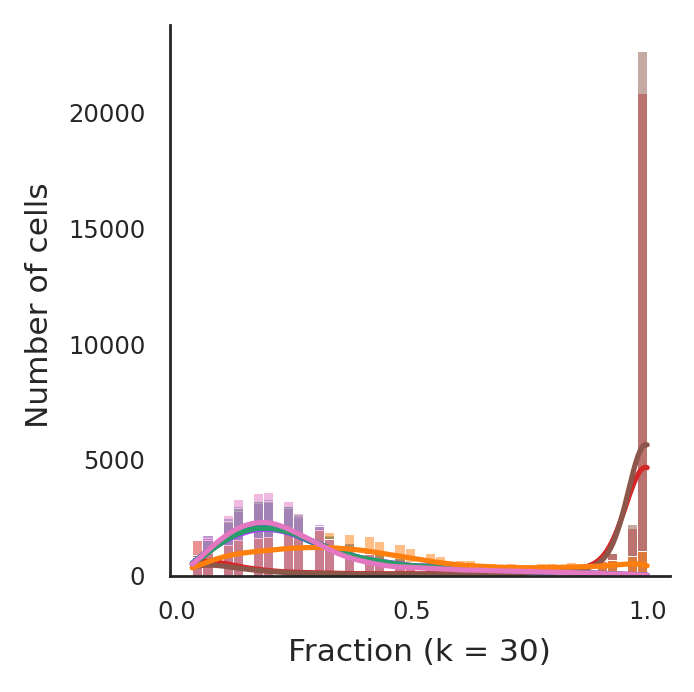

In [ ]:
#Maybe add number of cells below
palette={"PCA-100D":sns.color_palette()[0],"SCANVI-50D":sns.color_palette()[1],
                  "Recon MCML-50D":sns.color_palette()[2],"Condition-Sex MCML-50D (Full)":sns.color_palette()[3],"PCA-50D":sns.color_palette()[4],"Condition-Sex MCML-50D (Ref.)":sns.color_palette()[5],
                  "LDVAE-50D":sns.color_palette()[6]}

plt.figure(figsize=figsize)
#hue_order=["Condition-Sex MCML-50D (Ref.)","Condition-Sex MCML 50D (Full)","SCANVI 50D","LDVAE 50D","Recon MCML 50D","PCA 50D","PCA 100D"] #hue_order=hue_order 

g=sns.displot(data=mcmlNeigh, x="Condition", kde=True, hue='latent',legend=False,edgecolor="white",palette=palette,height=3,aspect=1) #legend=False


# plt.setp(g.collections, alpha=.6) #for the markers
#plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0)


plt.xlabel("Fraction (k = 30)",fontsize=axisFontSize)
plt.ylabel("Number of cells ",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

<Figure size 625x1875 with 0 Axes>

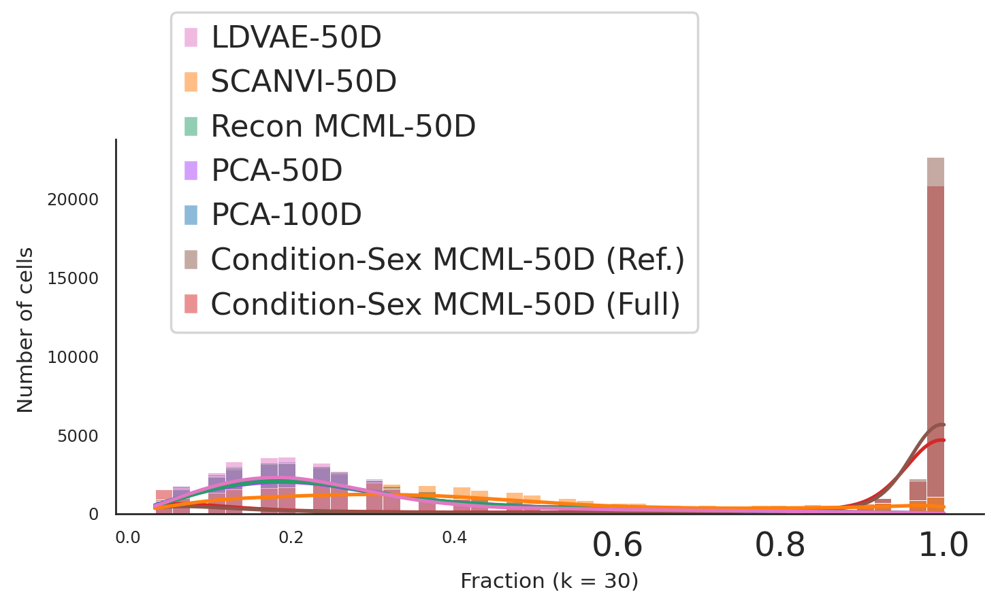

In [ ]:
#Maybe add number of cells below
palette={"PCA-100D":sns.color_palette()[0],"SCANVI-50D":sns.color_palette()[1],
                  "Recon MCML-50D":sns.color_palette()[2],"Condition-Sex MCML-50D (Full)":sns.color_palette()[3],"PCA-50D":sns.color_palette()[4],"Condition-Sex MCML-50D (Ref.)":sns.color_palette()[5],
                  "LDVAE-50D":sns.color_palette()[6]}

plt.figure(figsize=figsize)
#hue_order=["Condition-Sex MCML-50D (Ref.)","Condition-Sex MCML 50D (Full)","SCANVI 50D","LDVAE 50D","Recon MCML 50D","PCA 50D","PCA 100D"] #hue_order=hue_order 

g=sns.displot(data=mcmlNeigh, x="Condition", kde=True, hue='latent',legend=True,edgecolor="white",palette=palette,height=3,aspect=1) #legend=False


# plt.setp(g.collections, alpha=.6) #for the markers
sns.move_legend(obj = g, loc = 'upper left', bbox_to_anchor = (0.15, 1.2), frameon = True)
g._legend.set_title(None)

plt.ylim(ymin=0)


plt.xlabel("Fraction (k = 30)",fontsize=axisFontSize)
plt.ylabel("Number of cells ",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

<Figure size 625x1875 with 0 Axes>

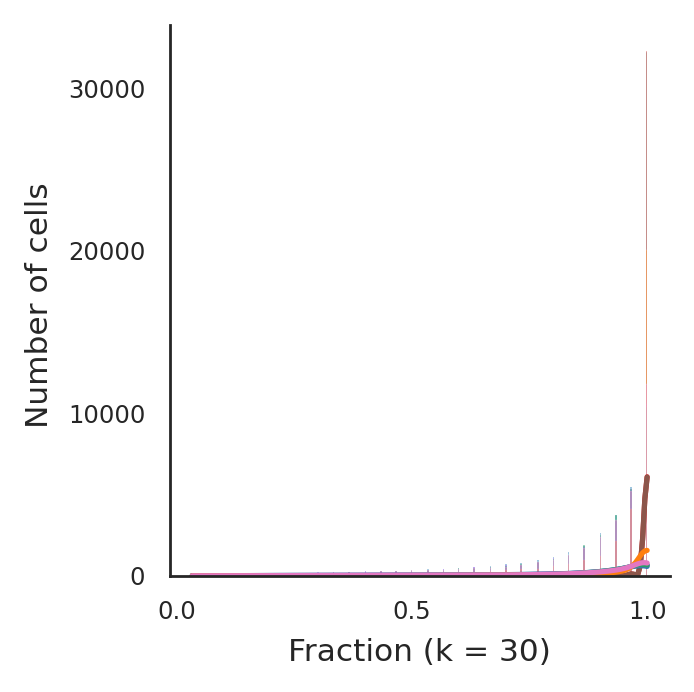

In [ ]:
#Maybe add number of cells below
palette={"PCA-100D":sns.color_palette()[0],"SCANVI-50D":sns.color_palette()[1],
                  "Recon MCML-50D":sns.color_palette()[2],"Condition-Sex MCML-50D (Full)":sns.color_palette()[3],"PCA-50D":sns.color_palette()[4],"Condition-Sex MCML-50D (Ref.)":sns.color_palette()[5],
                  "LDVAE-50D":sns.color_palette()[6]}

plt.figure(figsize=figsize)
#hue_order=["Condition-Sex MCML-50D (Ref.)","Condition-Sex MCML 50D (Full)","SCANVI 50D","LDVAE 50D","Recon MCML 50D","PCA 50D","PCA 100D"] #hue_order=hue_order 

g=sns.displot(data=mcmlNeigh, x="Sex", kde=True, hue='latent',legend=False,edgecolor="white",palette=palette,height=3,aspect=1) #legend=False


# plt.setp(g.collections, alpha=.6) #for the markers
#plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0)


plt.xlabel("Fraction (k = 30)",fontsize=axisFontSize)
plt.ylabel("Number of cells ",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

<Figure size 625x1875 with 0 Axes>

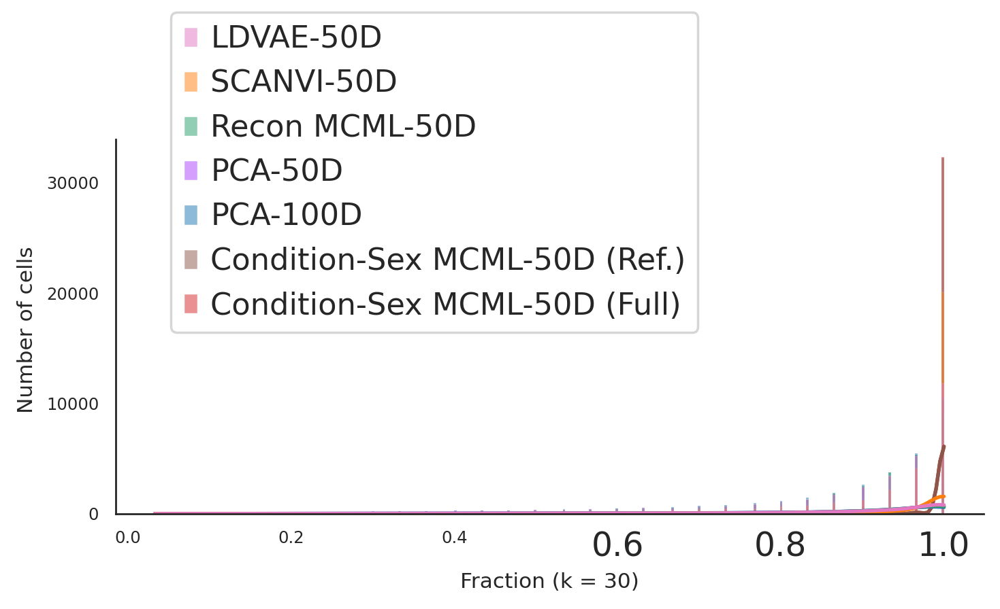

In [ ]:
#Maybe add number of cells below
palette={"PCA-100D":sns.color_palette()[0],"SCANVI-50D":sns.color_palette()[1],
                  "Recon MCML-50D":sns.color_palette()[2],"Condition-Sex MCML-50D (Full)":sns.color_palette()[3],"PCA-50D":sns.color_palette()[4],"Condition-Sex MCML-50D (Ref.)":sns.color_palette()[5],
                  "LDVAE-50D":sns.color_palette()[6]}

plt.figure(figsize=figsize)
#hue_order=["Condition-Sex MCML-50D (Ref.)","Condition-Sex MCML 50D (Full)","SCANVI 50D","LDVAE 50D","Recon MCML 50D","PCA 50D","PCA 100D"] #hue_order=hue_order 

g=sns.displot(data=mcmlNeigh, x="Sex", kde=True, hue='latent',legend=True,edgecolor="white",palette=palette,height=3,aspect=1) #legend=False


# plt.setp(g.collections, alpha=.6) #for the markers
sns.move_legend(obj = g, loc = 'upper left', bbox_to_anchor = (0.15, 1.2), frameon = True)
g._legend.set_title(None)

plt.ylim(ymin=0)


plt.xlabel("Fraction (k = 30)",fontsize=axisFontSize)
plt.ylabel("Number of cells ",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

MCML based prediction results

In [ ]:
mcmlPreds = pd.read_csv(data_path+'/all10XPreds_mcml.csv')

In [ ]:
mcmlPreds.head()

,Unnamed: 0,Accuracy,Embed,Label
0,0,0.384680,LDVAE 50D,Condition
1,1,0.390813,LDVAE 50D,Condition
2,2,0.388528,LDVAE 50D,Condition
3,3,0.927369,LDVAE 50D,Sex
4,4,0.924122,LDVAE 50D,Sex


In [ ]:
axisFontSize = 9
tickFontSize = 7
errwidth=1
figsize =(6,3)
dodge=0.4

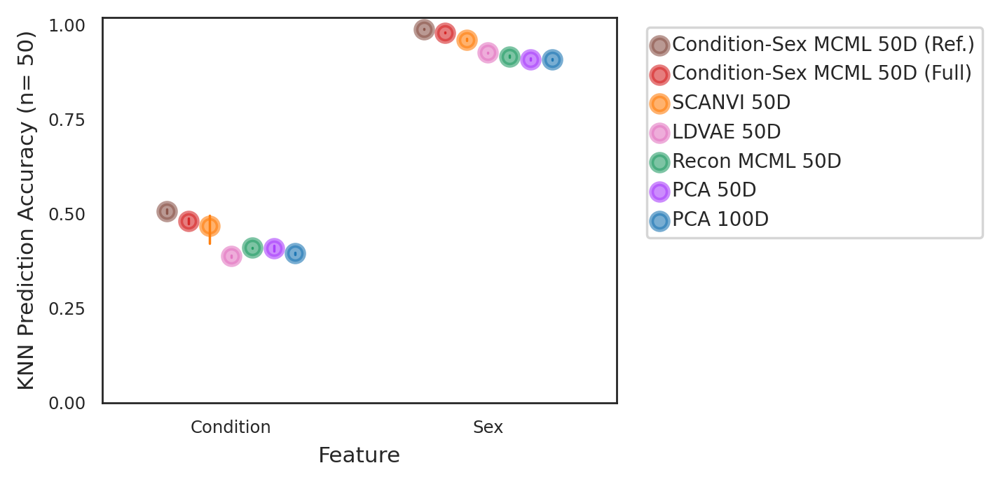

In [ ]:
#Maybe add number of cells below
palette={"PCA 100D":sns.color_palette()[0],"SCANVI 50D":sns.color_palette()[1],
                  "Recon MCML 50D":sns.color_palette()[2],"Condition-Sex MCML 50D (Full)":sns.color_palette()[3],"PCA 50D":sns.color_palette()[4],"Condition-Sex MCML 50D (Ref.)":sns.color_palette()[5],
                  "LDVAE 50D":sns.color_palette()[6],"PCA 50D UMAP":sns.color_palette()[7],
                  "PCA 50D t-SNE":sns.color_palette()[8]}

plt.figure(figsize=figsize)
hue_order=["Condition-Sex MCML 50D (Ref.)","Condition-Sex MCML 50D (Full)","SCANVI 50D","LDVAE 50D","Recon MCML 50D","PCA 50D","PCA 100D"] #hue_order=hue_order
g=sns.pointplot(x='Label', y='Accuracy', data=mcmlPreds, hue='Embed',palette=palette, hue_order=hue_order,err_style='bars',join=False,plot_kws=dict(alpha=0.6),errwidth=errwidth, dodge=0.5)
plt.setp(g.collections, alpha=.6) #for the markers
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left",prop={"size":8})

plt.ylim(ymin=0)

plt.xlabel("Feature",fontsize=axisFontSize)
plt.ylabel("KNN Prediction Accuracy (n= 50)",fontsize=axisFontSize)
plt.xticks(fontsize=tickFontSize)
plt.yticks(fontsize=tickFontSize)
plt.tight_layout()
plt.show()

In [ ]:
cond = mcmlPreds[mcmlPreds['Label'].isin(['Condition'])]

In [ ]:
ref = cond[cond['Embed'].isin(['Condition-Sex MCML 50D (Ref.)'])]
scanvi = cond[cond['Embed'].isin(['SCANVI 50D'])]

In [ ]:
(np.mean(ref['Accuracy'])-np.mean(scanvi['Accuracy']))/np.mean(scanvi['Accuracy'])

0.08070175438596507

In [ ]:
sex = mcmlPreds[mcmlPreds['Label'].isin(['Sex'])]

In [ ]:
ref = sex[sex['Embed'].isin(['Condition-Sex MCML 50D (Ref.)'])]
scanvi = sex[sex['Embed'].isin(['SCANVI 50D'])]

In [ ]:
(np.mean(ref['Accuracy'])-np.mean(scanvi['Accuracy']))/np.mean(scanvi['Accuracy'])

0.028665609613619282